# Libraries

In [1]:
libs = c('dplyr','magrittr','tidyr','purrr','stringr','data.table','lubridate','openxlsx',
         'ggplot2','ggExtra','grid','gridExtra','cowplot',
         'surveillance',
         'cmdstanr','StanHeaders','bayesplot')
for(x in libs) { suppressMessages(library(x, character.only=TRUE, warn.conflicts=FALSE, quietly=TRUE)) }

Sys.setlocale("LC_CTYPE", "en_US.UTF-8") # linux
options(scipen = 999)

set_cmdstan_path('/mnt/d/nlint/Dropbox/Programs/cmdstan/') |> suppressMessages()

# Output versions
version$version.string
cmdstan_version()

## Coded by Natalie Linton

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”


[1] "en_US.UTF-8"

[1] "R version 4.1.1 (2021-08-10)"

[1] "2.26.0"

# Functions

## R functions

In [2]:
# General functions
getmin <- \(x,digit) { plyr::round_any(min(x), digit, f=floor) }
getmax <- \(x,digit) { plyr::round_any(max(x), digit, f=ceiling) }
mmdd <- \(date) paste0(sprintf("%02d",month(ymd(date))),(sprintf("%02d",day(ymd(date)))))
yyyymmdd <- \(date) paste0(sprintf("%04d-",year(ymd(date))),sprintf("%02d-",month(ymd(date))),(sprintf("%02d",day(ymd(date)))))

# Distribution-related functions
gm_meansd_to_shaperate <- \(mu,sigma) { c((mu/sigma)^2, mu/(sigma^2)) }
ln_meansd_to_logmeanlogsd <- \(mu,sigma) { c( log(mu^2/sqrt(mu^2+sigma^2)), log(1+(sigma/mu)^2) ) }

disc_lnorm <- \(t, pars) { plnorm(t, pars[1], pars[2]) - plnorm(t-1, pars[1], pars[2]) }
disc_gamma <- \(t, pars) { pgamma(t, pars[1], pars[2]) - pgamma(t-1, pars[1], pars[2]) }
disc_unif <- \(t, pars) { punif(t, min=pars[1], max=pars[2]) - punif(t-1, min=pars[1], max=pars[2]) }
disc_weibull <- \(t, pars) { pweibull(t, pars[1], pars[2]) - pweibull(t-1, pars[1], pars[2]) }

In [3]:
get_reporting_delay <- \(dat, pars00) {
    rd <- dat$rd
    lik <- \(pars) { return(-sum(log((pweibull(rd+0.5, shape=pars[1], scale=pars[2]) - 
                                      pweibull(rd-0.5, shape=pars[1], scale=pars[2]))))) }
    options(warn=-1)
    opt_rd <- optim(pars00, fn=lik, method='BFGS', control = list(maxit=100000, trace=0))
    options(warn=0)
    opt_rd$par
}

In [4]:
get_reporting_delay_trunc <- \(dat, pars00) {
    rd <- dat$rd
    rd_t <- dat$rd_t
    lik <- \(pars) { return(-sum(log((pweibull(rd+0.5, shape=pars[1], scale=pars[2]) - 
                                      pweibull(rd-0.5, shape=pars[1], scale=pars[2])) / 
                                      (pweibull(rd_t, shape=pars[1], scale=pars[2]))))) }
    options(warn=-1)
    opt_rd <- optim(pars00, fn=lik, method='BFGS', control = list(maxit=100000, trace=0))
    options(warn=0)
    opt_rd$par
}

In [3]:
backproj_games <- \(df, pars, dists, grp_name, pmf_max=21) {
    
    T <- nrow(df)
    
    pmf_ <- eval(parse(text=paste0(dists[1], "(1:T, pars)")))[1:pmf_max] # pmf of first variable
    
    # Use surveillance package to backproject using pmf
    smth_par <- 2
    bp_ctrl <- list(k=smth_par, eps=rep(1e-4,smth_par), iter.max=rep(1000,smth_par), Tmark=nrow(df), B=-1, alpha=0.01, verbose=FALSE, lambda0=NULL, eq3a.method="C")
    sts_out <- surveillance::backprojNP(new("sts", epoch=df$t, observed=df[grp_name]), incu.pmf=pmf_, control=bp_ctrl)
    df$bp <- c(surveillance::upperbound(sts_out)); df$bp[df$bp<=0.01] <- 0

    # Normalize
    df |> mutate(!!paste0(grp_name,"_norm") := bp/sum(bp)*eval(parse(text=paste0("sum(",grp_name,")"))))
}

In [4]:
backproj_rdxip <- \(df, pars1, pars2, dists, pmf_max=21) {
    
    # Backproject twice (report to onset, onset to infection) for cases missing onset
    T <- nrow(df)
    rd_pmf <- eval(parse(text=paste0(dists[1], "(1:T, pars1)")))[1:pmf_max] # pmf of first variable
    ip_pmf <- eval(parse(text=paste0(dists[2], "(1:T, pars2)")))[1:pmf_max] # pmf of second variable
    
    # Use surveillance package to backproject from report to onset
    smth_par <- 2
    bp_ctrl <- list(k=smth_par, eps=rep(1e-4,smth_par), iter.max=rep(1000,smth_par), 
                    Tmark=nrow(df), B=-1, alpha=0.01, verbose=FALSE, lambda0=NULL, eq3a.method="C")
    sts_out <- surveillance::backprojNP(new("sts", epoch=df$t, observed=df["reported"]), incu.pmf=rd_pmf, control=bp_ctrl)
    df$r2o_bp <- c(surveillance::upperbound(sts_out)); df$r2o_bp[df$r2o_bp<0.01] <- 0

    # Combine normalized backprojected case count (i.e. now by date of onset) with known dates of onset
    df <- df |> mutate(r2o_norm=r2o_bp/sum(r2o_bp)*sum(reported), onset_all=onset+r2o_norm)
    
    # Use surveillance package to backproject from onset to infection
    sts_out <- surveillance::backprojNP(new("sts", epoch=df$t, observed=df["onset_all"]), incu.pmf=ip_pmf, control=bp_ctrl)
    df$o2i_bp <- c(surveillance::upperbound(sts_out)); df$o2i_bp[df$o2i_bp<=0.01] <- 0
    
    df |> mutate(tokyo_norm=o2i_bp/sum(o2i_bp)*sum(onset_all))
}

## R functions for plots

In [5]:
fig_bar <- \(dat, vars) { 
    ggplot(dat) +
    geom_bar(aes_string(x=vars[1], fill=vars[2]), stat="count") +
    scale_x_date(paste0("Date ", vars[1]), date_breaks="2 weeks", date_labels="%b %d", expand=c(0,0)) +
    scale_y_continuous("Number of cases", expand=c(0,0)) +
    scale_fill_discrete("") +
    theme_classic() +
    theme(text=element_text(size=18),
          plot.title=element_text(size=18),
          axis.title=element_text(size=18),
          legend.text=element_text(size=18),
          legend.position="bottom") 
}

In [6]:
fig_bar_wrap <- \(dat, vars) { 
    ggplot(dat) +
    geom_bar(aes_string(x=vars[1], fill=vars[2]), stat="count") +
    facet_wrap(as.formula(paste("~", vars[3]))) +
    scale_x_date("Date reported", breaks="2 weeks", date_labels="%b %d", expand=c(0,0)) +
    scale_y_continuous("Number of cases", expand=c(0,0)) +
    scale_fill_discrete("") +
    theme_classic() +
    theme(text=element_text(size=18),
          plot.title=element_text(size=18),
          axis.title=element_text(size=18),
          legend.text=element_text(size=18),
          legend.position="bottom") 
}

In [7]:
# Plot showing reporting delay
delay_plot <- \(df) {
  fsize <- 16
  delay99 <- as.numeric(df |> summarize(upper = quantile(rd,prob=.99)))
  delay95 <- as.numeric(df |> summarize(upper = quantile(rd,prob=.95)))
  T <- length(seq(min(df$report), max(df$report), 1))
  p_df <- df |> filter(rd<=delay99) |> group_by(onset) |> count(rd) |> ungroup() |> 
          right_join(expand.grid(onset=seq.Date(min(df$onset),max(df$onset),1), rd=seq(1,delay99,1)), by=c('onset','rd')) |> 
          replace_na(list(n=0)) |> filter(n>0)
  onsets <- p_df$onset |> unique()
  line_df <- data.frame(onset=c(onsets,max(onsets)+1), rd=rev(seq(0,length(onsets),1)))

  ggplot(p_df, aes(x=onset, y=rd)) + 
    geom_tile(aes(fill=n)) +
    geom_line(data=line_df, linetype='dashed') +
    scale_x_date("Date of illness onset", limits=c(min(onsets),max(onsets)+2)) +
    scale_y_continuous("Reporting delay", breaks=seq(0, delay99, 2)) +
    scale_fill_distiller("Number\nof cases", palette = "Blues", direction=1) +
    coord_cartesian(expand=FALSE, ylim=c(0,delay99)) +
    theme_classic() +
    theme(text=element_text(size=fsize),
          plot.title=element_text(size=fsize),
          axis.title=element_text(size=fsize),
          legend.text=element_text(size=fsize))
}

In [8]:
post_prior <- function(mod) {
    
    mu_mean_priors=c(1.4,2)
    mu_sigma_priors=c(2,1)
    
    days_lab <- function(x) paste0("Rt (",x,")")
    set.seed(123)
    T <- 3
    grp <- c("games", "tokyo")
    par <- c(sapply(grp, \(i) paste0("R_",i,"[",1:T,"]")))
    var <- c(sapply(grp, \(i) paste0(stringr::str_to_title(i)," period ",1:T)))
    posterior <- rbindlist(lapply(seq_along(par), function(x) { mod$draws(par[x], format = "df") %>% select(-contains('.')) %>% rename(mu=1) %>% mutate(variable = var[x], type = "posterior") } ))
    len <- nrow(posterior)/length(par)
    prior <- data.frame(mu=rep(rnorm(len, Rt_priors[1], Rt_priors[2]), length(par)), variable=rep(var,each=len), type="prior") 
    yrep <- bind_rows(posterior, prior)
    
    ggplot(data = yrep) + 
      geom_density(aes(mu, fill=type), alpha=.5) + 
      facet_wrap(~variable, scales="free", strip.position = c("bottom"), labeller=as_labeller(days_lab)) +
      scale_y_continuous("Density") +
      scale_x_continuous("", limits=c(0,9), expand=c(0,0), breaks=seq(0,8,2)) +
      scale_fill_discrete("") +
      theme_classic() +
      theme(text = element_text(size=16),
            strip.background=element_rect(color="white", fill="white"),
            strip.text = element_text(size = 16, margin = margin(0.2, 0, 0.2, 0, "cm"), hjust=0.5), #
            strip.placement = "outside",
            panel.spacing.x = unit(2, "lines"))
}

## Stan functions

In [9]:
stan_funcs <- "functions {
   /*
    * Returns discretized gamma cdf
    *
    * @param alpha  Alpha parameter of gamma distribution
    * @param beta   Beta parameter of gamma distribution
    * @param K      Length of input vector
    *
    * return cdf
    */
    vector pgamma(real alpha, real beta, int K) {
      vector[K] res;
      for (k in 1:K)
        res[k] = gamma_cdf(k, alpha, beta);
        return append_row(res[1], res[2:K]-res[1:(K-1)]);
    }

   /*
    * Returns convolution of two vectors
    *
    * @param X      Vector X
    * @param Yrev   Reverse of vector Y
    * @param K      Length of vectors X and Yrev
    *
    * return cdf
    */
    vector convolution(vector X, vector Yrev, int K) {
        vector[K-1] res;
        res[1] = X[1]*Yrev[K];
        for (k in 2:K-1)
            res[k] = dot_product(head(X, k), tail(Yrev, k));
        return res;
    }

   /*
    * Returns next-generation matrix including assortativity
    *
    * @param X      Vector X
    * @param Yrev   Reverse of vector Y
    * @param K      Length of vectors X and Yrev
    *
    * return cdf
    */
    vector[,] get_ngm(real theta, vector n, vector[] Rt, int G, int D) {
        array[G, G] vector[D-1] res;
        res = { { Rt[1], ( (1.0 - theta) * n[2] ) * ( Rt[2] / ( theta + (1.0 - theta) * n[2] ) ) }, // first row of ngm
                { ( (1.0 - theta) * n[1] ) * ( Rt[1] / ( theta + (1.0 - theta) * n[1] ) ),  Rt[2] } }; // second row of ngm
        return res;
    }
}"
stan_funcs_file <- write_stan_file(stan_funcs)

# Dates

In [10]:
today <- Sys.Date()
t0_ <- as.Date("2020-01-01")
tend_ <- as.Date("2021-10-31")

w5_start <- as.Date("2021-06-22")
tokyo_soe_starts <- as.Date(c("2020-04-07","2021-01-07","2021-04-25","2021-07-12"))
tokyo_soe_ends <- as.Date(c("2020-05-14","2021-03-21","2021-06-20","2021-09-30"))
tokyo_manbo_starts <- as.Date(c("2021-04-12","2021-06-21"))
tokyo_manbo_ends <- as.Date(c("2021-04-24","2021-07-11"))

burnin <- 14
op_ec_start <- as.Date("2021-06-28")
op_ec_end <- as.Date("2021-09-10")

# New years (period of increased mobility) dates
tokyo_rd_ny_calc_start <- as.Date("2020-11-01")
tokyo_rd_ny_calc_end <- as.Date("2021-01-31")
ny_t0 <- as.Date("2020-12-01")
ny_start <- as.Date("2020-12-26")
pre_ny <- as.Date("2020-12-19")
ny_end <- as.Date("2021-01-03")
ny_burn <- ny_start-7

# Olympics dates
olympics_start <- as.Date("2021-07-21")
olympics_opening <- as.Date("2021-07-23")
july_holiday_end <- as.Date("2021-07-25")
olympics_end <- as.Date("2021-08-08")
tokyo_rd_o_calc_start <- as.Date("2021-06-01")
tokyo_rd_o_calc_end <- as.Date("2021-08-31")
olympics_mid <- olympics_start + (as.numeric(olympics_end - olympics_start)/2)

# Paralympics dates
paralympics_start <- as.Date("2021-08-24")
paralympics_end <- as.Date("2021-09-05")
tokyo_rd_p_calc_start <- as.Date("2021-07-01")
tokyo_rd_p_calc_end <- as.Date("2021-09-30")
paralympics_mid <- paralympics_start + (as.numeric(paralympics_end - paralympics_start)/2)

# Date cuts
ny_cuts <- c(pre_ny, ny_start, ny_end) ; ny_cuts # by start
opg_cuts <- c(as.Date("2021-07-12"), olympics_start, july_holiday_end+1, olympics_end+1, paralympics_start, 
              as.Date("2021-09-07")-6) ; opg_cuts # by start, except for final cut

# Date vectors
t_calc <- data.frame(date=seq.Date(as.Date(opg_cuts[1]),today-1,1)) |> mutate(t=1:n())
t_all <- data.frame(date=seq.Date(t0_,tend_,1)) |> mutate(t=1:n())

[1] "2020-12-19" "2020-12-26" "2021-01-03"

[1] "2021-07-12" "2021-07-21" "2021-07-26" "2021-08-09" "2021-08-24"
[6] "2021-09-01"

# Data

## Tokyo dataframe

In [11]:
# tokyo_cases <- read.csv("https://stopcovid19.metro.tokyo.lg.jp/data/130001_tokyo_covid19_patients.csv") 
# write.csv(tokyo_cases, "../../Data/tokyo_20210901.csv")
tokyo_cases <- read.csv("../../Data/tokyo_20211008.csv") 
names(tokyo_cases)
names(tokyo_cases) <- c("id", "geo_code", "pref", "subpref", "report", "onset", "confirmed", "res_city", "age_decade", "sex", "job", "status", "symptoms", "int_travel", "contact_hx", "note", "discharged")
tokyo <- tokyo_cases |> mutate(report=as.Date(report, "%Y-%m-%d"), onset=as.Date(onset, "%Y-%m-%d"))
rbind(tokyo |> head(3), tokyo |> tail(3))

[1] "No"                      "全国地方公共団体コード" 
 [3] "都道府県名"              "市区町村名"             
 [5] "公表_年月日"             "発症_年月日"            
 [7] "確定_年月日"             "患者_居住地"            
 [9] "患者_年代"               "患者_性別"              
[11] "患者_職業"               "患者_状態"              
[13] "患者_症状"               "患者_渡航歴の有無フラグ"
[15] "患者_接触歴の有無フラグ" "備考"                   
[17] "退院済フラグ"

,id,geo_code,pref,subpref,report,onset,confirmed,res_city,age_decade,sex,job,status,symptoms,int_travel,contact_hx,note,discharged
,<int>,<int>,<chr>,<lgl>,<date>,<date>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<int>,<lgl>,<int>
1,1,130001,東京都,NA,2020-01-24,NA,,湖北省武漢市,40代,男性,,NA,NA,NA,NA,NA,1
2,2,130001,東京都,NA,2020-01-25,NA,,湖北省武漢市,30代,女性,,NA,NA,NA,NA,NA,1
3,3,130001,東京都,NA,2020-01-30,NA,,湖南省長沙市,30代,女性,,NA,NA,NA,NA,NA,1
376494,375610,130001,東京都,NA,2021-10-07,NA,,,70代,男性,,NA,NA,NA,NA,NA,NA
376495,375611,130001,東京都,NA,2021-10-07,NA,,,60代,女性,,NA,NA,NA,NA,NA,NA
376496,375612,130001,東京都,NA,2021-10-07,NA,,,20代,女性,,NA,NA,NA,NA,NA,NA


In [12]:
tokyo |> filter(report>="2021-07-01" & report<"2021-10-01") |> nrow()
tokyo |> filter(report>="2021-04-01" & report<"2021-07-01") |> nrow()

[1] 201482

[1] 52948

## Games dataframe

In [13]:
tokyo2020 <- read.csv("https://raw.githubusercontent.com/nlinton/covid19_tokyo2020/main/data/tokyo2020_linelist.csv", na.strings=c("NA"))  |>
             mutate(report=as.Date(reported), announced=as.Date(announced, "%Y-%m-%d"), 
                    reported=case_when(is.na(reported) ~ announced, TRUE ~ (as.Date(reported, "%Y-%m-%d"))),
                    jpn_resident=factor(jpn_resident, levels=c("resident", "non-resident")),
                    quarantine=factor(quarantine, labels=c("After quarantine", "During quarantine"))) |>
             dplyr::select(-reported)

kanto <- c("Chiba", "Gunma", "Ibaraki", "Kanagawa", "Saitama", "Tochigi", "Tokyo")

In [14]:
games <- tokyo2020 |> filter(grepl("O|P|HC",id) & report_pref %in% kanto)
games |> arrange(desc(report)) |> slice(1L)

id,announced,jpn_resident,quarantine,category,report_pref,harumi_resident,n_contacts,links,team,sport,note,report
<chr>,<date>,<fct>,<fct>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<date>
P-314,2021-09-08,resident,NA,Tokyo 2020 contractor,Tokyo,no,NA,,,,,2021-09-07


In [15]:
games_df <- games |> count(report) |> rename(date=1, games=2)
games_to_backproj <- t_all |> left_join(games_df, by="date") |> replace_na(list(games=0))
rbind(head(games_to_backproj,3), tail(games_to_backproj,3))

,date,t,games
,<date>,<int>,<dbl>
1,2020-01-01,1,0
2,2020-01-02,2,0
3,2020-01-03,3,0
668,2021-10-29,668,0
669,2021-10-30,669,0
670,2021-10-31,670,0


# Parameters

In [16]:
groups <- c("games", "tokyo")

# Generation interval and incubation period
giip_df <- rbind(data.frame(type="GI", variant="Wild-type", wave="Wave 3", dist="gamma", mean=4.45, sd=2.36) |> mutate(par1=gm_meansd_to_shaperate(mean,sd)[1], par2=gm_meansd_to_shaperate(mean,sd)[2]),
                data.frame(type="IP", variant="Wild-type", wave="Wave 3", dist="lnorm", mean=4.99, sd=2.93) |> mutate(par1=ln_meansd_to_logmeanlogsd(mean,sd)[1], par2=ln_meansd_to_logmeanlogsd(mean,sd)[2]))
giip_df

gi_pars <- as.numeric((giip_df |> filter(type=="GI"))[c("par1","par2")])
covid_ip_pars <- as.numeric((giip_df |> filter(type=="IP"))[c("par1","par2")]) # parameters for incubation period
# covid_ip_pars <- c("meanlog"=1.519, "sdlog"=0.615) # Linton et al. 2020?

type,variant,wave,dist,mean,sd,par1,par2
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
GI,Wild-type,Wave 3,gamma,4.45,2.36,3.555462,0.7989802
IP,Wild-type,Wave 3,lnorm,4.99,2.93,1.459323,0.2962258


# Backprojection

## Get reporting delays

In [17]:
rd_init <- c(2,10)

In [1]:
devtools::install_github("nlinton/myR", force=TRUE)
myR::getmin(123,10)
library(myR)
ls("package:myR")

✔  checking for file ‘/tmp/RtmpIJzD8O/remotes69851651098/nlinton-myR-dbe5e9c/DESCRIPTION’ (591ms)
─  preparing ‘myR’:
✔  checking DESCRIPTION meta-information
─  checking for LF line-endings in source and make files and shell scripts
─  checking for empty or unneeded directories
   Omitted ‘LazyData’ from DESCRIPTION
─  building ‘myR_0.0.0.9000.tar.gz’
   


Installing package into ‘/home/nlint/R/x86_64-pc-linux-gnu-library/4.1’
(as ‘lib’ is unspecified)



[1] 120

[1] "getmax" "getmin"

### Tokyo NY (01Nov-31Jan)

,report,onset,rd,rd_t
,<date>,<date>,<dbl>,<dbl>
44097,2021-01-31,2021-01-29,2,287
44098,2021-01-31,2021-01-28,3,288
44099,2021-01-31,2021-01-28,3,288
44100,2021-01-31,2021-01-27,4,289
44101,2021-01-31,2021-01-30,1,286
44102,2021-01-31,2021-01-28,3,288


ERROR: Error: 'get_reporting_delay_pars' is not an exported object from 'namespace:myR'


ERROR: Error in names(tokyo_rd_pars_ny) <- c("shape", "scale"): object 'tokyo_rd_pars_ny' not found


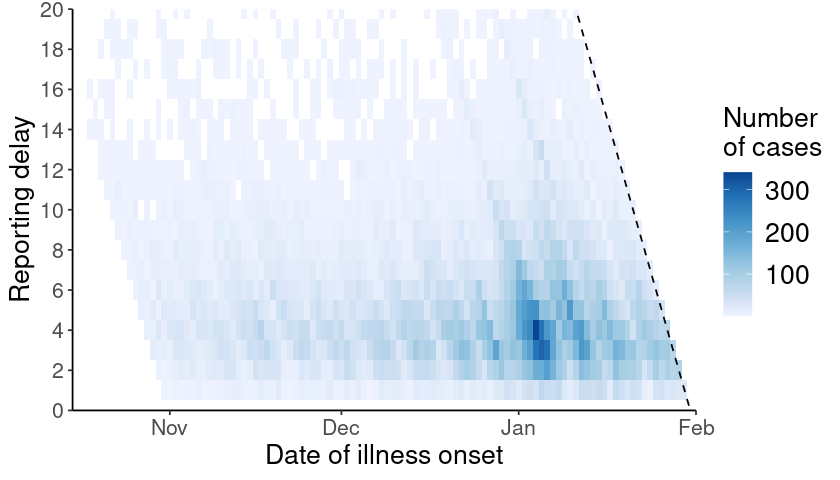

In [27]:
options(repr.plot.width=6,repr.plot.height=4)
rd_df <- tokyo[,c("report","onset")] |> 
         mutate(rd=case_when(as.numeric(report-onset)>0 ~ as.numeric(report-onset), 
                             TRUE ~ as.numeric(report-onset)+0.5),
                rd_t=as.numeric(today-onset)) |> 
         filter(report >= tokyo_rd_ny_calc_start & report <= tokyo_rd_ny_calc_end & rd >= 0 & rd <= 30) |> drop_na()
tail(rd_df)

options(repr.plot.width=7,repr.plot.height=4)
delay_plot(rd_df)

tokyo_rd_pars_ny <- myR::get_reporting_delay_pars(rd_df, rd_init, "weibull") ; names(tokyo_rd_pars_ny) <- c("shape", "scale")
# tokyo_rd_pars_ny <- get_reporting_delay(rd_df, rd_init) ; names(tokyo_rd_pars_ny) <- c("shape", "scale")
tokyo_rd_meansd_ny <- as.numeric(mixdist::weibullparinv(tokyo_rd_pars_ny[1], tokyo_rd_pars_ny[2]))
sprintf("Tokyo reporting delay: shape=%.4f, scale=%.4f", tokyo_rd_pars_ny[1], tokyo_rd_pars_ny[2])
sprintf("Tokyo reporting delay: mean=%.4f, sd=%.4f", tokyo_rd_meansd_ny[1], tokyo_rd_meansd_ny[2])

### Tokyo Games (01Jun-30Sep)

In [ ]:
rd_df_games <- tokyo[,c("report","onset")] |> 
               mutate(rd=case_when(as.numeric(report-onset)>0 ~ as.numeric(report-onset), 
                                  TRUE ~ as.numeric(report-onset)+0.5),
                      rd_t=as.numeric(today-onset)) |> 
               filter(report >= tokyo_rd_o_calc_start & report <= tokyo_rd_p_calc_end & rd >= 0 & rd <= 30) |> drop_na()
tail(rd_df_games)

options(repr.plot.width=7,repr.plot.height=4)
delay_plot(rd_df_games)

tokyo_rd_pars_opg <- get_reporting_delay(rd_df_games, rd_init) ; names(tokyo_rd_pars_opg) <- c("shape", "scale")
tokyo_rd_meansd_opg <- as.numeric(mixdist::weibullparinv(tokyo_rd_pars_opg[1], tokyo_rd_pars_opg[2]))
sprintf("Tokyo reporting delay: shape=%.4f, scale=%.4f", tokyo_rd_pars_opg[1], tokyo_rd_pars_opg[2])
sprintf("Tokyo reporting delay: mean=%.4f, sd=%.4f", tokyo_rd_meansd_opg[1], tokyo_rd_meansd_opg[2])

## Tokyo NY (01Nov-31Jan) and Games (01Jun-30Sep)

In [ ]:
backproj_rdxip <- \(df, pars1, pars2, dists, pmf_max=21) {
    
    # Backproject twice (report to onset, onset to infection) for cases missing onset
    T <- nrow(df)
    rd_pmf <- eval(parse(text=paste0(dists[1], "(1:T, pars1)")))[1:pmf_max] # pmf of first variable
    ip_pmf <- eval(parse(text=paste0(dists[2], "(1:T, pars2)")))[1:pmf_max] # pmf of second variable
    
    # Use surveillance package to backproject from report to onset
    smth_par <- 2
    bp_ctrl <- list(k=smth_par, eps=rep(1e-4,smth_par), iter.max=rep(1000,smth_par), 
                    Tmark=nrow(df), B=-1, alpha=0.01, verbose=FALSE, lambda0=NULL, eq3a.method="C")
    sts_out <- surveillance::backprojNP(new("sts", epoch=df$t, observed=df["unk.onset.rep"]), incu.pmf=rd_pmf, control=bp_ctrl)
    df$r2o_bp <- c(surveillance::upperbound(sts_out)); df$r2o_bp[df$r2o_bp<0.01] <- 0

    # Combine normalized backprojected case count (i.e. now by date of onset) with known dates of onset
    df <- df |> mutate(r2o_norm=r2o_bp/sum(r2o_bp)*sum(unk.onset.rep), onset_all=onset+r2o_norm)
    
    # Use surveillance package to backproject from onset to infection
    sts_out <- surveillance::backprojNP(new("sts", epoch=df$t, observed=df["onset_all"]), incu.pmf=ip_pmf, control=bp_ctrl)
    df$o2i_bp <- c(surveillance::upperbound(sts_out)); df$o2i_bp[df$o2i_bp<=0.01] <- 0
    
    df |> mutate(tokyo_norm=o2i_bp/sum(o2i_bp)*sum(onset_all))
}

In [25]:
# Backproject all Tokyo cases, then later select dates of interest
# Get number of cases by date of onset and date of report
tokyo_allrep <- tokyo |> count(date=report) |> rename("all_reported"=n)
tokyo_unk <- tokyo |> filter(is.na(onset)) |> count(date=report) |> rename("unk.onset.rep"=n)
tokyo_ons <- tokyo |> filter(!is.na(onset)) |> count(date=onset) |> rename("onset"=n)
tokyo_to_backproj <- t_all |> left_join(tokyo_allrep, by="date") |> replace_na(list("all_reported"=0)) |> 
                              left_join(tokyo_unk, by="date") |> replace_na(list("unk.onset.rep"=0)) |> 
                              left_join(tokyo_ons, by="date") |> replace_na(list("onset"=0))

# Tokyo parameters
tokyo_backproj_dists <- c("disc_weibull", "disc_lnorm")

# Backproject Tokyo using NY reporting delay
tokyo_ny_bp_df <- tokyo_to_backproj |> filter(date>=tokyo_rd_ny_calc_start & date<=tokyo_rd_ny_calc_end)
tokyo_backproj_ny <- backproj_rdxip(tokyo_ny_bp_df, tokyo_rd_pars_ny, covid_ip_pars, tokyo_backproj_dists)
tokyo_backproj_ny

date,t,all_reported,unk.onset.rep,onset,r2o_bp,r2o_norm,onset_all,o2i_bp,tokyo_norm
<date>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2020-11-01,306,116,46,117,208.50650,198.89146,315.8915,976.1268,975.1098
2020-11-02,307,87,23,173,184.99310,176.46235,349.4624,563.5934,563.0063
2020-11-03,308,209,70,185,146.61088,139.85008,324.8501,243.3640,243.1104
2020-11-04,309,122,66,156,115.38525,110.06439,266.0644,216.6781,216.4523
2020-11-05,310,269,81,177,98.46722,93.92652,270.9265,287.3622,287.0628
2020-11-06,311,242,95,184,94.33191,89.98190,273.9819,359.1838,358.8096
2020-11-07,312,294,120,159,104.40152,99.58717,258.5872,379.3344,378.9391
2020-11-08,313,189,80,167,128.09122,122.18444,289.1844,356.0592,355.6882
2020-11-09,314,156,54,208,151.71605,144.71984,352.7198,333.4125,333.0652


In [26]:
# Backproject Tokyo using Games period reporting delay
tokyo_games_bp_df <- tokyo_to_backproj |> filter(date>=tokyo_rd_o_calc_start & date<=tokyo_rd_p_calc_end)
tokyo_backproj_opg <- backproj_rdxip(tokyo_games_bp_df, tokyo_rd_pars_opg, covid_ip_pars, tokyo_backproj_dists)
tokyo_backproj_opg

date,t,all_reported,unk.onset.rep,onset,r2o_bp,r2o_norm,onset_all,o2i_bp,tokyo_norm
<date>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2021-06-01,518,471,144,294,456.85773,455.72167,749.7217,1314.0897,1318.7909
2021-06-02,519,487,155,271,318.59546,317.80321,588.8032,738.5255,741.1676
2021-06-03,520,508,160,245,165.89642,165.48389,410.4839,306.5462,307.6429
2021-06-04,521,472,155,234,91.14464,90.91799,324.9180,267.5752,268.5325
2021-06-05,522,436,152,230,70.26902,70.09428,300.0943,317.5291,318.6651
2021-06-06,523,351,117,228,80.16080,79.96146,307.9615,351.0083,352.2640
2021-06-07,524,235,72,260,101.62927,101.37655,361.3766,351.3495,352.6065
2021-06-08,525,369,106,278,114.92875,114.64296,392.6430,349.2013,350.4506
2021-06-09,526,440,124,273,110.97860,110.70263,383.7026,366.6314,367.9430


## Olympics and Paralympics

In [93]:
# Games parameters
games_bp_pars <- c(min=1, max=4) # min, max for uniform distribution
# games_backproj_dists <- c("disc_unif", "disc_gamma")
games_backproj_dists <- "disc_unif"

games_backproj <- backproj_games(games_to_backproj, games_bp_pars, games_backproj_dists, "games")
games_backproj

date,t,games,bp,games_norm
<date>,<int>,<dbl>,<dbl>,<dbl>
2020-01-01,1,0,0,0
2020-01-02,2,0,0,0
2020-01-03,3,0,0,0
2020-01-04,4,0,0,0
2020-01-05,5,0,0,0
2020-01-06,6,0,0,0
2020-01-07,7,0,0,0
2020-01-08,8,0,0,0
2020-01-09,9,0,0,0


# Epicurves

## Data epicurves

In [166]:
get_ec <- \(dat, grp, type) {
    
    get_data <- \(dat) { dat |> filter(date>=op_ec_start & date<=op_ec_end) }
    
    if (type=="infection") {
        usedat <- get_data(dat) 
        n_per_day <- usedat$cases
    } else if (type=="report" & grp=="tokyo") {
        usedat <- get_data(dat) |> count(date) |> rename(cases=n)
        n_per_day <- usedat$cases
    }  else if (type=="report" & grp=="games") {
        usedat <- get_data(dat) |> count(date, jpn_resident) |> rename(cases=n)
        n_per_day <- (get_data(dat) |> count(date))[,"n"]
        
    } 
    
    max_y <- ifelse(grp=="tokyo", getmax(n_per_day, 1000), getmax(n_per_day, 50))
    lab_y <- max_y
    cols <- c("opg" = "#549aab", "obs" = "#acbbe6", "shade" = "grey")
    
    ggplot(usedat) +
    annotate("rect", xmin=olympics_start, xmax=olympics_end, ymin=0, ymax=Inf, fill=cols["opg"], alpha=0.3) +
    annotate("rect", xmin=paralympics_start, xmax=paralympics_end, ymin=0, ymax=Inf, fill=cols["opg"], alpha=0.3) +
    geom_vline(xintercept=c(olympics_start, olympics_end, paralympics_start, paralympics_end), 
               color=cols[1], linetype="dashed", size=0.9) +
    
    geom_bar(aes(x=date, y=cases), stat="identity", fill="white", color="white") +
    { if (type=="report" & grp=="tokyo") geom_bar(aes(x=date, y=cases), stat="identity", 
                                         fill=cols["obs"], color=cols["obs"], width=1, alpha=0.7) } +
    { if (type=="report" & grp=="games") geom_bar(aes(x=date, y=cases), stat="identity", 
                                         fill=cols["obs"], color=cols["obs"], width=1, alpha=0.7) } +
    
    # Data censoring areas
    { if (type=="infection") annotate("rect", xmin=op_ec_start-1, xmax=opg_cuts[1], ymin=0, ymax=Inf, fill=cols[3], alpha=0.3) } +
    { if (type=="infection") annotate("rect", xmin=opg_cuts[6], xmax=op_ec_end+1, ymin=0, ymax=Inf, fill=cols[3], alpha=0.3) } +
    { if (type=="infection") geom_vline(xintercept=c(opg_cuts[1], opg_cuts[6]), color="black", linetype="dashed", size=0.5) } +
    
    annotate("label", x=olympics_mid, y=max_y, label="Olympic games", hjust=0.5, vjust=1) +
    annotate("label", x=paralympics_mid, y=max_y, label="Paralympic games", hjust=0.5, vjust=1) +
    
    { if (type=="report") scale_x_date("\nDate of report", expand=c(0,0), limits=c(op_ec_start-1, op_ec_end+1)) } +
    { if (type=="infection") scale_x_date("\nDate of infection", expand=c(0,0), limits=c(op_ec_start-1, op_ec_end+1)) } +
    scale_y_continuous(expand=c(0,0), limits=c(0, max_y)) +
    { if (type=="report") ylab("Incidence\n") } +
    { if (type=="infection") ylab("") } +
    theme_bw() +
    { if (grp=="tokyo") theme(plot.margin=margin(0,1,0,0,unit="cm")) } +
    { if (grp=="games") theme(plot.margin=margin(0,1.8,0,0,unit="cm")) } +
    theme(text=element_text(size=16), panel.grid.major=element_blank(), panel.grid.minor=element_blank())
}

tokyo_inf <- tokyo_backproj_opg[c("date","t","tokyo_norm")] |> rename(cases=tokyo_norm)
tokyo_rep <- tokyo |> rename(date=report)
games_inf <- games_backproj[c("date","t","games_norm")] |> rename(cases=games_norm)
games_rep <- games |> rename(date=report)
                
ec_tokyo_rep <- get_ec(tokyo_rep, "tokyo", "report")
ec_games_rep <- get_ec(games_rep, "games", "report")
ec_tokyo_inf <- get_ec(tokyo_inf, "tokyo", "infection")
ec_games_inf <- get_ec(games_inf, "games", "infection")

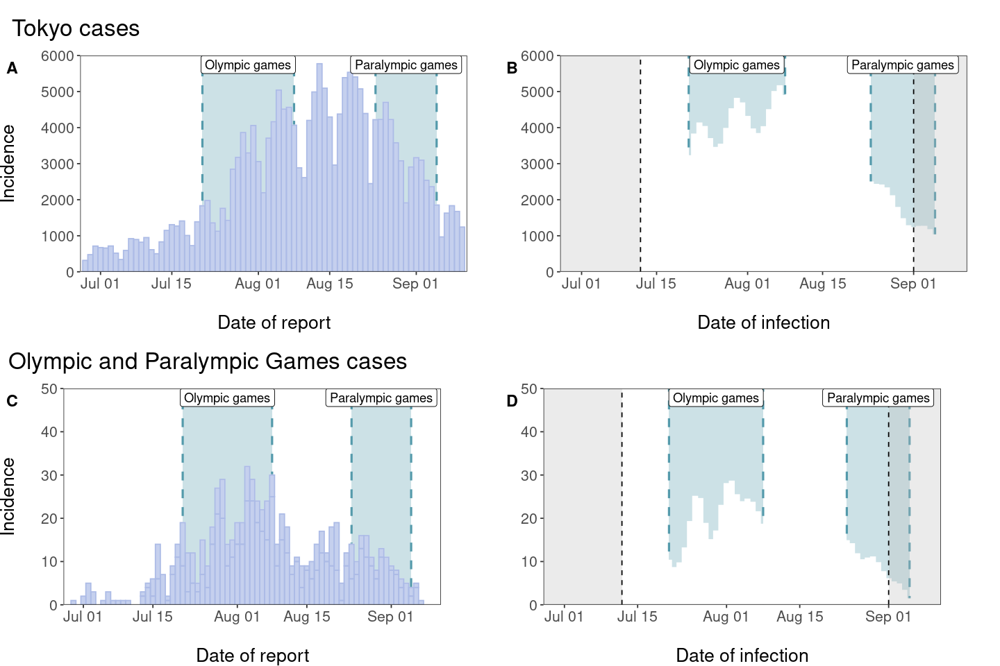

In [167]:
options(repr.plot.width=12,repr.plot.height=8)

ec_title_tokyo <- ggdraw() + draw_label("Tokyo cases", x=0, hjust=0, size=20) + theme(plot.margin=margin(0,0,0,10))
ec_title_games <- ggdraw() + draw_label("Olympic and Paralympic Games cases", x=0, hjust=0, size=20) + theme(plot.margin=margin(0,0,0,7))

ec_tokyo <- cowplot::plot_grid(ec_title_tokyo, 
                               cowplot::plot_grid(ec_tokyo_rep, ec_tokyo_inf, ncol=2, labels=LETTERS[1:2]),
                               ncol=1, rel_heights = c(0.2, 1))
ec_games <- cowplot::plot_grid(ec_title_games, 
                               cowplot::plot_grid(ec_games_rep, ec_games_inf, ncol=2, labels=LETTERS[3:4]), 
                               ncol=1, rel_heights = c(0.2, 1))

ec_all <- cowplot::plot_grid(ec_tokyo, ec_games, nrow=2)
ec_all 
ggsave("../figures/epicurves.pdf", ec_all, width=12, height=10)

# Joint likelihood NY and OPG

## Stan code

In [96]:
stan_joint <- "functions {
   /*
    * Returns discretized gamma cdf
    *
    * @param alpha  Alpha parameter of gamma distribution
    * @param beta   Beta parameter of gamma distribution
    * @param K      Length of input vector
    *
    * return cdf
    */
    vector pgamma(real alpha, real beta, int K) {
      vector[K] res;
      for (k in 1:K)
        res[k] = gamma_cdf(k, alpha, beta);
        return append_row(res[1], res[2:K]-res[1:(K-1)]);
    }

   /*
    * Returns convolution of two vectors
    *
    * @param X      Vector X
    * @param Yrev   Reverse of vector Y
    * @param K      Length of vectors X and Yrev
    *
    * return cdf
    */
    vector convolution(vector X, vector Yrev, int K) {
        vector[K-1] res;
        res[1] = X[1]*Yrev[K];
        for (k in 2:K-1)
            res[k] = dot_product(head(X, k), tail(Yrev, k));
        return res;
    }

   /*
    * Returns assortativity-based next-generation matrix
    *
    *
    * return cdf
    */
    matrix get_ngm(real theta, vector n, vector Rt, int G, int D) {
        matrix[G, G] res;
        res = [[ Rt[1], ( (1.0 - theta) * n[2] ) * ( Rt[2] / ( theta + (1.0 - theta) * n[2] ) ) ], // first row of ngm
                [ ( (1.0 - theta) * n[1] ) * ( Rt[1] / ( theta + (1.0 - theta) * n[1] ) ),  Rt[2] ]]; // second row of ngm
        return res;
    }
}

data {
   int<lower=1> D_ny; // number of days in NY dataset
   int<lower=1> D_opg; // number of days in Olympic and Paralympic Games (OPG) dataset
   int<lower=1> T_ny; // number of Rt steps for NY time period
   int<lower=1> T_opg; // number of Rt steps for OPG time period
   int<lower=1> G; // number of groups during OPG period (OPG, Tokyo)

   // for assortativity
   real<lower=0, upper=1> theta; // assortativity measure
   vector<lower=0>[G] n; // population size of each group

   // externals of renewal equation
   int<lower=1> vec_ny[T_ny];
   int<lower=1> vec_opg[T_opg];
   int<lower=0> t_ny1[vec_ny[1]]; 
   int<lower=0> t_ny2[vec_ny[2]]; 
   int<lower=0> t_opg1[vec_opg[1]]; 
   int<lower=0> t_opg2[vec_opg[2]]; 
   int<lower=0> t_opg3[vec_opg[3]]; 
   int<lower=0> t_opg4[vec_opg[4]]; 
   int<lower=0> t_opg5[vec_opg[5]]; 

   // Considering spectators
   int<lower=0> t_ny1c[vec_ny[1]]; 
   int<lower=0> t_ny2c[vec_ny[2]]; 
   int<lower=0> t_opg1c[vec_opg[1]]; 
   int<lower=0> t_opg2c[vec_opg[2]];
   int<lower=0> t_opg3c[vec_opg[3]]; 
   int<lower=0> t_opg4c[vec_opg[4]];
   int<lower=0> t_opg5c[vec_opg[5]];
   real<lower=0, upper=1> k_frac_g;
   real<lower=0, upper=1> k_frac_t;

   // internals of renewal equation
   vector<lower=0>[D_ny] cases_ny;
   matrix<lower=0>[D_opg, G] cases_opg;
   real<lower=0> gi_par1;
   real<lower=0> gi_par2;
}

transformed data {
   vector[D_ny-1] conv_ny; 
   array[G] vector[D_opg-1] conv_opg; 
   {
   // Convolution NY
   vector[D_ny] gi_ny = pgamma(gi_par1, gi_par2, D_ny);
   vector[D_ny] gi_rev_ny;
   for (d in 1:D_ny) 
       gi_rev_ny[d] = gi_ny[D_ny+1-d];
   conv_ny = convolution(cases_ny, gi_rev_ny, D_ny); 

   // Convolution OPG
   vector[D_opg] gi_opg = pgamma(gi_par1, gi_par2, D_opg); 
   vector[D_opg] gi_rev_opg;
   for (d in 1:D_opg) 
       gi_rev_opg[d] = gi_opg[D_opg+1-d];
   for (g in 1:G) 
       conv_opg[g] = convolution(cases_opg[,g], gi_rev_opg, D_opg); 
   }
}

parameters {
   real<lower=0> rel_k;
   real<lower=0> Rt_ny;
   array[T_opg] vector<lower=0>[G] Rt_opg;
}

transformed parameters {
    // Original fit
    matrix<lower=0>[G, G] ngm1 = get_ngm(theta, n, Rt_opg[1], G, D_opg);
    matrix<lower=0>[G, G] ngm2 = get_ngm(theta, n, Rt_opg[2], G, D_opg);
    matrix<lower=0>[G, G] ngm3 = get_ngm(theta, n, Rt_opg[3], G, D_opg);
    matrix<lower=0>[G, G] ngm4 = get_ngm(theta, n, Rt_opg[4], G, D_opg);
    matrix<lower=0>[G, G] ngm5 = get_ngm(theta, n, Rt_opg[5], G, D_opg);

    // Spectators counterfactual
    real<lower=0> rel_k_g = ((rel_k - 1) * k_frac_g) + 1; // Games spectators counterfactual rel_k
    real<lower=0> rel_k_t = ((rel_k - 1) * k_frac_t) + 1; // Tokyo spectators counterfactual rel_k
    matrix<lower=0>[G, G] ngm2sg = get_ngm(theta, n, Rt_opg[2] * rel_k_g, G, D_opg); // Spectator counterfactual
    matrix<lower=0>[G, G] ngm3sg = get_ngm(theta, n, Rt_opg[3] * rel_k_g, G, D_opg); // Spectator counterfactual
    matrix<lower=0>[G, G] ngm5sg = get_ngm(theta, n, Rt_opg[5] * rel_k_g, G, D_opg); // Spectator counterfactual
    matrix<lower=0>[G, G] ngm2st = get_ngm(theta, n, Rt_opg[2] * rel_k_t, G, D_opg); // Spectator counterfactual
    matrix<lower=0>[G, G] ngm3st = get_ngm(theta, n, Rt_opg[3] * rel_k_t, G, D_opg); // Spectator counterfactual
    matrix<lower=0>[G, G] ngm5st = get_ngm(theta, n, Rt_opg[5] * rel_k_t, G, D_opg); // Spectator counterfactual
}

model {
    // Fit to NY data
    target += gamma_lpdf(cases_ny[t_ny1] | Rt_ny * conv_ny[t_ny1c], 1.0) + log(1e-8)
            + gamma_lpdf(cases_ny[t_ny2] | Rt_ny * rel_k * conv_ny[t_ny2c], 1.0) + log(1e-8);

    // Fit to OPG data
    for (g in 1:G) {
        target += gamma_lpdf(cases_opg[t_opg1,g] | ngm1[g, 1] * conv_opg[g][t_opg1c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg1,g] | ngm1[g, 2] * conv_opg[g][t_opg1c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg2,g] | ngm2[g, 1] * conv_opg[g][t_opg2c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg2,g] | ngm2[g, 2] * conv_opg[g][t_opg2c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg3,g] | ngm3[g, 1] * conv_opg[g][t_opg3c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg3,g] | ngm3[g, 2] * conv_opg[g][t_opg3c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg4,g] | ngm4[g, 1] * conv_opg[g][t_opg4c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg4,g] | ngm4[g, 2] * conv_opg[g][t_opg4c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg5,g] | ngm5[g, 1] * conv_opg[g][t_opg5c], 1.0) + log(1e-8)
                + gamma_lpdf(cases_opg[t_opg5,g] | ngm5[g, 2] * conv_opg[g][t_opg5c], 1.0) + log(1e-8);
    }
}

generated quantities {

    vector<lower=0>[D_ny-14] Ect_ny = append_row(Rt_ny * conv_ny[t_ny1c], Rt_ny * rel_k * conv_ny[t_ny2c]);

    real<lower=0> Rt_ny_elev = Rt_ny * rel_k;
    array[T_opg] vector<lower=0>[G] Rt_spec = { [ Rt_opg[1,1],           Rt_opg[1,2] ]',
                                                [ Rt_opg[2,1] * rel_k_g, Rt_opg[2,2] * rel_k_t ]',
                                                [ Rt_opg[3,1] * rel_k_g, Rt_opg[3,2] * rel_k_t ]',
                                                [ Rt_opg[4,1],           Rt_opg[4,2] ]',
                                                [ Rt_opg[5,1] * rel_k_g, Rt_opg[5,2] * rel_k_t ]' };

    array[G] vector<lower=0>[D_opg-14] Ect_opg;
    for (g in 1:G) {
        Ect_opg[g] = append_row((ngm1[g, 1] * conv_opg[g][t_opg1c]) + (ngm1[g, 2] * conv_opg[g][t_opg1c]),
                     append_row((ngm2[g, 1] * conv_opg[g][t_opg2c]) + (ngm2[g, 2] * conv_opg[g][t_opg2c]),
                     append_row((ngm3[g, 1] * conv_opg[g][t_opg3c]) + (ngm3[g, 2] * conv_opg[g][t_opg3c]),
                     append_row((ngm4[g, 1] * conv_opg[g][t_opg4c]) + (ngm4[g, 2] * conv_opg[g][t_opg4c]),
                                (ngm5[g, 1] * conv_opg[g][t_opg5c]) + (ngm5[g, 2] * conv_opg[g][t_opg5c]))))); 
    }

    // Use transformed spectator NGM during Games, use fitted NGM during other times
    array[G] vector<lower=0>[D_opg-14] Ect_spec;
        Ect_spec[1] = append_row((ngm1[1, 1] * conv_opg[1][t_opg1c])   + (ngm1[1, 2]   * conv_opg[1][t_opg1c]),
                      append_row((ngm2sg[1, 1] * conv_opg[1][t_opg2c]) + (ngm2sg[1, 2] * conv_opg[1][t_opg2c]),
                      append_row((ngm3sg[1, 1] * conv_opg[1][t_opg3c]) + (ngm3sg[1, 2] * conv_opg[1][t_opg3c]),
                      append_row((ngm4[1, 1] * conv_opg[1][t_opg4c])   + (ngm4[1, 2]   * conv_opg[1][t_opg4c]),
                                 (ngm5sg[1, 1] * conv_opg[1][t_opg5c]) + (ngm5sg[1, 2] * conv_opg[1][t_opg5c])))));
        Ect_spec[2] = append_row((ngm1[2, 1] * conv_opg[2][t_opg1c])   + (ngm1[2, 2]   * conv_opg[2][t_opg1c]),
                      append_row((ngm2st[2, 1] * conv_opg[2][t_opg2c]) + (ngm2st[2, 2] * conv_opg[2][t_opg2c]),
                      append_row((ngm3st[2, 1] * conv_opg[2][t_opg3c]) + (ngm3st[2, 2] * conv_opg[2][t_opg3c]),
                      append_row((ngm4[2, 1] * conv_opg[2][t_opg4c])   + (ngm4[2, 2]   * conv_opg[2][t_opg4c]),
                                 (ngm5st[2, 1] * conv_opg[2][t_opg5c]) + (ngm5st[2, 2] * conv_opg[2][t_opg5c]))))); 
}"
stan_joint_file = write_stan_file(stan_joint)

In [97]:
## Function to run stan
run_mod_joint <- \(dat_ny, dat_opg, theta, games_k_frac, tokyo_k_frac, modno) {

groups <- c("games","tokyo")
pop_N <- c(games=110000, tokyo=13.96*1000000) # population size for each group; games population size should be avg/day
pop_n <- pop_N/sum(pop_N)
    
t_ny1 = ny_df$t[ny_t_cuts[1]:(ny_t_cuts[2]-1)]
t_ny2 = ny_df$t[ny_t_cuts[2]:ny_t_cuts[3]]
t_opg1 = opg_df$t[opg_t_cuts[1]:(opg_t_cuts[2]-1)]
t_opg2 = opg_df$t[opg_t_cuts[2]:(opg_t_cuts[3]-1)]
t_opg3 = opg_df$t[opg_t_cuts[3]:(opg_t_cuts[4]-1)]
t_opg4 = opg_df$t[opg_t_cuts[4]:(opg_t_cuts[5]-1)]
t_opg5 = opg_df$t[opg_t_cuts[5]:opg_t_cuts[6]]
    
    
data_list = list(
    ## lengths
    D_ny = tail(ny_t_cuts,1),
    D_opg = tail(opg_t_cuts,1),
    T_ny = length(ny_t_cuts)-1,
    T_opg = length(opg_t_cuts)-1,
    G = length(groups),
    
    ## assortativity
    theta = theta,
    n = pop_n,
    
    ## renewal equation externals
    vec_ny = ny_t_lengths,
    vec_opg = opg_t_lengths,
    t_ny1 = t_ny1,
    t_ny2 = t_ny2,
    t_opg1 = t_opg1,
    t_opg2 = t_opg2,
    t_opg3 = t_opg3,
    t_opg4 = t_opg4,
    t_opg5 = t_opg5,
    
    ## consider spectators
    k_frac_g = games_k_frac,
    k_frac_t = tokyo_k_frac,
    t_ny1c = t_ny1-1,
    t_ny2c = t_ny2-1,
    t_opg1c = t_opg1-1,
    t_opg2c = t_opg2-1,
    t_opg3c = t_opg3-1,
    t_opg4c = t_opg4-1,
    t_opg5c = t_opg5-1,
    
    ## renewal equation internals
    cases_ny = dat_ny$tokyo_norm,
    cases_opg = data.matrix(dat_opg[,c("games_norm","tokyo_norm")]),
    gi_par1 = gi_pars[1],
    gi_par2 = gi_pars[2]
)

data_file = tempfile(fileext = ".json")
write_stan_json(data_list, data_file)

recalc = TRUE
output_dir = "stan_output"
if (!dir.exists(output_dir)) 
    dir.create(output_dir)
if (recalc) {
    start_time <- Sys.time()
    set_mod <- cmdstan_model(stan_joint_file)
    mod <- set_mod$sample(data=data_file,
#                           init=init_file,
                          iter_sampling=1250,
                          iter_warmup=2000,
                          chains=4,
                          parallel_chains=4,
                          adapt_delta=0.98,
                          seed=1,
                          fixed_param=FALSE)
    end_time <- Sys.time()
    # save results of the simulations 
    out_dir <- "stan_output"
    dir.create(out_dir)
    mod$save_output_files(dir=out_dir, basename=paste0("renewal_process_mod", modno), timestamp=FALSE, random=FALSE)
    mod$save_data_file(dir=out_dir, basename=paste0("data", modno), timestamp=FALSE, random=FALSE)
    print(end_time - start_time)
    # checking that everything is alright
    mod$cmdstan_diagnose()
} else {
    output_files = c()
    for (fl_ in list.files(output_dir, "*.csv", full.names = TRUE))
        if (!grepl("diagnostic", fl_, fixed = TRUE))
            output_files = c(output_files, fl_)
    mod <- as_cmdstan_fit(output_files)
}
    
    return(mod)

}

## Joint data

In [98]:
# NY data
ny_df <- tokyo_backproj_ny[c("date","tokyo_norm")] |> filter(date>=ny_cuts[1]-burnin & date<=tail(ny_cuts,1)) |>
          mutate(t=1:n()) |>
          relocate(t, .after=date)
head(ny_df,2)

# OPG data
opg_df <- tokyo_backproj_opg[c("date","tokyo_norm")] |> 
          left_join(games_backproj[c("date","games_norm")], by="date") |>
          filter(date>=opg_cuts[1]-burnin & date<=opg_cuts[6]) |> 
          mutate(t=1:n()) |>
          relocate(t, .after=date)
head(opg_df,2)

ny_t_cuts <- ny_df$t[ny_df$date %in% ny_cuts] ; ny_t_cuts
ny_t_lengths <- c(ny_t_cuts[2]-ny_t_cuts[1], ny_t_cuts[3]+1-ny_t_cuts[2]) ; ny_t_lengths
opg_t_cuts <- opg_df$t[opg_df$date %in% opg_cuts] ; opg_t_cuts
opg_t_lengths <- c(opg_t_cuts[2]-opg_t_cuts[1], opg_t_cuts[3]-opg_t_cuts[2], opg_t_cuts[4]-opg_t_cuts[3],
                   opg_t_cuts[5]-opg_t_cuts[4], opg_t_cuts[6]+1-opg_t_cuts[5]) ; opg_t_lengths
checkme <- rbind(opg_t_cuts[1]:opg_t_cuts[6], rep(opg_t_lengths, opg_t_lengths)) ; checkme

,date,t,tokyo_norm
,<date>,<int>,<dbl>
1,2020-12-05,1,613.4632
2,2020-12-06,2,568.0541


,date,t,tokyo_norm,games_norm
,<date>,<int>,<dbl>,<dbl>
1,2021-06-28,1,616.2397,1.103605
2,2021-06-29,2,625.5013,2.410097


[1] 15 22 30

[1] 7 9

[1] 15 24 29 43 58 66

[1]  9  5 14 15  9

15,16,17,18,19,20,21,22,23,24,⋯,57,58,59,60,61,62,63,64,65,66
9,9,9,9,9,9,9,9,9,5,⋯,15,9,9,9,9,9,9,9,9,9


In [99]:
thetas <- c(0.9, 0.95, 0.99)
k_fracs_g <- c(0.3, 0.5, 0.7)
k_fracs_t <- c(0.6, 0.8, 1)
models <- expand.grid(theta=thetas, k_frac_g=k_fracs_g, k_frac_t=k_fracs_t)
nmods <- nrow(models)
models

theta,k_frac_g,k_frac_t
<dbl>,<dbl>,<dbl>
0.90,0.3,0.6
0.95,0.3,0.6
0.99,0.3,0.6
0.90,0.5,0.6
0.95,0.5,0.6
0.99,0.5,0.6
0.90,0.7,0.6
0.95,0.7,0.6
0.99,0.7,0.6


In [100]:
modlist <- lapply(1:nmods, \(i) { run_mod_joint(ny_df, opg_df, models[i,1], models[i,2], models[i,3], i) })
names(modlist) <- paste0("mod",1:nmods)

Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 1 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 1 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 1 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 1 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 1 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 1 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 1 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 1 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 1 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 4 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 1 Iteration: 2300 / 3250 [ 70%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iter

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data1.json



Time difference of 1.173463 mins
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod1-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data2.json



Time difference of 3.763633 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod2-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 3 Iteration: 1

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data3.json



Time difference of 3.714337 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod3-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 3 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 3 Iterat

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data4.json



Time difference of 4.305312 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod4-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data5.json



Time difference of 3.925336 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod5-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 3 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 3 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 3 Iteration: 1

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data6.json



Time difference of 3.797496 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod6-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iterat

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data7.json



Time difference of 4.245244 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod7-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteratio

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data8.json



Time difference of 3.904362 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod8-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data9.json



Time difference of 3.824567 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod9-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%]  (Wa

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iterat

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data10.json



Time difference of 4.219544 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod10-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data11.json



Time difference of 3.850189 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod11-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 3 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data12.json



Time difference of 3.885011 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod12-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iterat

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data13.json



Time difference of 4.221946 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod13-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 2 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 2 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data14.json



Time difference of 3.735971 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod14-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 3 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 3 Iteration: 1

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data15.json



Time difference of 3.813099 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod15-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iterat

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data16.json



Time difference of 4.189867 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod16-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 3 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 2 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 2 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 2 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 3 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 3 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 3 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 3 

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data17.json



Time difference of 4.053198 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod17-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 3 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 4 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 3 Iteratio

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data18.json



Time difference of 3.781193 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod18-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iterat

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data19.json



Time difference of 4.339419 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod19-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data20.json



Time difference of 3.892282 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod20-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data21.json



Time difference of 3.895851 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod21-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 1 Iteration: 2300 / 3250 [ 70%]  (Sampling) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iter

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data22.json



Time difference of 4.321421 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod22-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data23.json



Time difference of 4.009708 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod23-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 3 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data24.json



Time difference of 3.771574 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod24-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 1 Iteration: 2100 / 3250 [ 64%]  (Sampling) 
Chain 1 Iteration: 2200 / 3250 [ 67%]  (Sampling) 
Chain 1 Iteration: 2300 / 3250 [ 70%]  (Sampling) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iter

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data25.json



Time difference of 4.265649 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod25-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 2 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 2 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 2 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data26.json



Time difference of 3.856214 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod26-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.
Running MCMC with 4 parallel chains...

Chain 1 Iteration:    1 / 3250 [  0%] 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: filec73d6b0e67_model_namespace::log_prob: ngm5sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 129, column 4 to column 84)

Chain 1 If this warning occurs sporadically, such as for highly constr

Chain 2 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 2 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 2 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 2 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 2 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 2 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 2 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 2 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 2 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 2 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: filec73d6b0e67_model_namespace::log_prob: ngm2sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 127, column 4 to column 84)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 3 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 3 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 3 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 3 Iteration:  400 / 3250 [ 12%]  (Warmup) 
Chain 3 Iteration:  500 / 3250 [ 15%]  (Warmup) 
Chain 3 Iteration:  600 / 3250 [ 18%]  (Warmup) 
Chain 3 Iteration:  700 / 3250 [ 21%]  (Warmup) 
Chain 3 Iteration:  800 / 3250 [ 24%]  (Warmup) 
Chain 3 Iteration:  900 / 3250 [ 27%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: filec73d6b0e67_model_namespace::log_prob: ngm3sg[sym1__, sym2__] is -nan, but must be greater than or equal to 0 (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 128, column 4 to column 84)

Chain 3 If this warning occurs sporadically, such as for highly constr

Chain 4 Iteration:    1 / 3250 [  0%]  (Warmup) 
Chain 4 Iteration:  100 / 3250 [  3%]  (Warmup) 
Chain 4 Iteration:  200 / 3250 [  6%]  (Warmup) 
Chain 4 Iteration:  300 / 3250 [  9%]  (Warmup) 
Chain 4 Iteration:  400 / 3250 [ 12%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: gamma_lpdf: Shape parameter[1] is inf, but must be positive finite! (in '/tmp/Rtmp9O9Mzf/model-c738d1f660.stan', line 137, column 4 to line 138, column 93)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fin

Chain 1 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 1 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 1 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 1 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 1 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 1 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 1 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 1 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 1 Iteration: 1800 / 3250 [ 55%]  (Warmup) 
Chain 1 Iteration: 1900 / 3250 [ 58%]  (Warmup) 
Chain 1 Iteration: 2000 / 3250 [ 61%]  (Warmup) 
Chain 1 Iteration: 2001 / 3250 [ 61%]  (Sampling) 
Chain 2 Iteration: 1000 / 3250 [ 30%]  (Warmup) 
Chain 2 Iteration: 1100 / 3250 [ 33%]  (Warmup) 
Chain 2 Iteration: 1200 / 3250 [ 36%]  (Warmup) 
Chain 2 Iteration: 1300 / 3250 [ 40%]  (Warmup) 
Chain 2 Iteration: 1400 / 3250 [ 43%]  (Warmup) 
Chain 2 Iteration: 1500 / 3250 [ 46%]  (Warmup) 
Chain 2 Iteration: 1600 / 3250 [ 49%]  (Warmup) 
Chain 2 Iteration: 1700 / 3250 [ 52%]  (Warmup) 
Chain 2 Iteration:

Warning message in dir.create(out_dir):
“'stan_output' already exists”
Moved 4 files and set internal paths to new locations:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-1.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-2.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-3.csv
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-4.csv

Moved data file and set internal path to new location:
- /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/data27.json



Time difference of 3.955262 secs
Processing csv files: /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-1.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-2.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-3.csv, /mnt/d/nlint/Dropbox/Hokkaido_COVID/COVID_Japan_Tokyo2020_rt/Natalie/scripts/stan_output/renewal_process_mod27-4.csv

Checking sampler transitions treedepth.
Treedepth satisfactory for all transitions.

Checking sampler transitions for divergences.
No divergent transitions found.

Checking E-BFMI - sampler transitions HMC potential energy.
E-BFMI satisfactory for all transitions.

Effective sample size satisfactory.

Split R-hat values satisfactory all parameters.

Processing complete, no problems detected.


In [101]:
modlist[[1]]$summary()

variable,mean,median,sd,mad,q5,q95,rhat,ess_bulk,ess_tail
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lp__,-174540.028000000,-174540.00000000,2.43359825774,2.96520000000,-174545.000000000,-174537.000000000,1.0019989,2167.116,3029.726
rel_k,1.211709286,1.21131000,0.01763894548,0.01770965700,1.182758000,1.240761000,1.0016040,4003.788,3639.322
Rt_ny,1.205799994,1.20559000,0.01502191179,0.01497426000,1.181859500,1.231412500,1.0009604,4113.600,3750.672
"Rt_opg[1,1]",9.629501764,9.61895000,0.44549937451,0.43793038800,8.908064500,10.382740000,1.0016759,6691.503,3801.586
"Rt_opg[2,1]",3.443393348,3.43879000,0.22813609012,0.22832781300,3.074611000,3.825697500,1.0014112,6621.032,3598.763
"Rt_opg[3,1]",3.308750750,3.30960500,0.10219470288,0.09962330700,3.140365500,3.473751000,1.0014172,6414.196,3410.980
"Rt_opg[4,1]",3.077911752,3.07749500,0.10063958064,0.09919335300,2.911155500,3.246417000,1.0015557,7160.132,3717.766
"Rt_opg[5,1]",2.674126170,2.67295500,0.14102812262,0.13883807700,2.440367500,2.906060500,1.0009237,6986.419,3489.087
"Rt_opg[1,2]",1.310831104,1.31074000,0.01024773714,0.01023735300,1.294057500,1.327701000,1.0001518,7623.751,3648.033


## Posterior checks

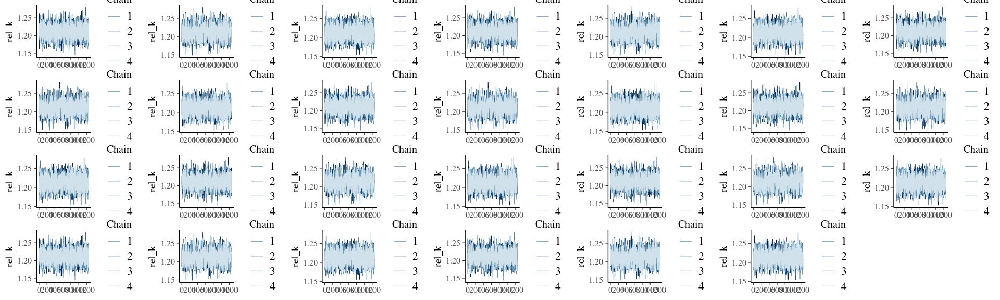

In [102]:
## Rel_k
ncol <- 7; nrow <- ceiling(nmods/ncol)
options(repr.plot.width=16, repr.plot.height=1.2*nrow)
rel_k_plist <- lapply(1:nmods, \(i) mcmc_trace(modlist[[i]]$draws("rel_k")))
cowplot::plot_grid(plotlist=rel_k_plist, nrow=nrow)

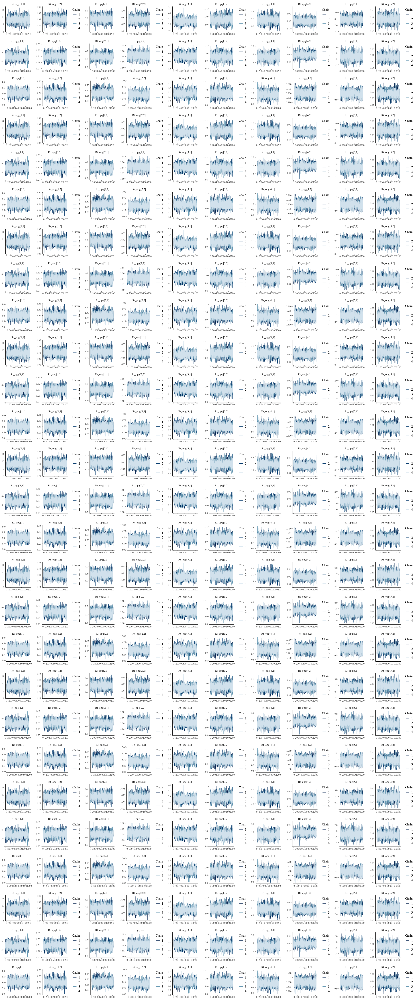

In [103]:
# OPG Rt checks
ncol <- 5 ; nrow <- nmods
options(repr.plot.width=4.5*ncol, repr.plot.height=2*nrow)
traces <- lapply(1:nmods, \(i) { lapply(1:5, \(t) { 
    mcmc_trace(modlist[[i]]$draws(c(paste0("Rt_opg[", t, ",1]"), paste0("Rt_opg[", t, ",2]")))) }) })
rtplotlist <- lapply(1:nmods, \(i) cowplot::plot_grid(plotlist=traces[[i]], ncol=ncol))
cowplot::plot_grid(plotlist=rtplotlist, nrow=nmods)

In [104]:
modlist[[1]]$summary(c("Rt_spec"), ~quantile(.x, probs = c(0.025, 0.25, 0.5, 0.75, 0.975)))

variable,2.5%,25%,50%,75%,97.5%
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
"Rt_spec[1,1]",8.7694127,9.3323150,9.6189500,9.9247125,10.5391500
"Rt_spec[2,1]",3.1971188,3.4966400,3.6554950,3.8249100,4.1502488
"Rt_spec[3,1]",3.3023808,3.4460700,3.5207300,3.5919675,3.7291007
"Rt_spec[4,1]",2.8799742,3.0109475,3.0774950,3.1447450,3.2799450
"Rt_spec[5,1]",2.5512745,2.7429600,2.8425900,2.9434375,3.1409177
"Rt_spec[1,2]",1.2908898,1.3039050,1.3107400,1.3177400,1.3314300
"Rt_spec[2,2]",1.8088570,1.8372675,1.8519950,1.8667625,1.8962007
"Rt_spec[3,2]",1.2117882,1.2271800,1.2354900,1.2443225,1.2608120
"Rt_spec[4,2]",0.8930969,0.8977297,0.9003365,0.9027743,0.9073804


## Get results

In [105]:
res_par <- c("rel_k", "Rt_ny", "Rt_ny_elev", "Rt_opg", "Rt_spec", "Ect_ny", "Ect_opg", "Ect_spec")
res_par_labs <- c("Relative k", "Rt (ny)", "Rt (ny_elev)", "Rt (opg)", "Rt (spec)", "Est (ny)", "Ect (opg)", "Ect (spec)")

res <- lapply(1:nmods, \(i) {
       data.frame(list(modlist[[i]]$summary(res_par, ~quantile(.x, probs = c(0.025, 0.25, 0.5, 0.75, 0.975))))) |> 
       rename(l95=2, l50=3, median=4, u50=5, u95=6) })

In [106]:
rbindlist(lapply(1:nmods, \(i) res[[i]] |> filter(variable=="rel_k"))) |> distinct()

variable,l95,l50,median,u50,u95
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
rel_k,1.176779,1.199848,1.211310,1.223762,1.245943
rel_k,1.178310,1.200017,1.211635,1.223297,1.246571
rel_k,1.178639,1.199708,1.211855,1.223853,1.246585


In [107]:
# scenario with theta=0.99, k_games=0.5, k_tokyo=1 === #24
res[[24]] |> filter(grepl("Rt|k", variable)) |> mutate(cp=sprintf("%.2f (%.2f, %.2f)", median, l95, u95)) |> arrange(variable)

variable,l95,l50,median,u50,u95,cp
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
rel_k,1.1786395,1.1997075,1.2118550,1.2238525,1.2465850,"1.21 (1.18, 1.25)"
Rt_ny,1.1777098,1.1954325,1.2055850,1.2156350,1.2351920,"1.21 (1.18, 1.24)"
Rt_ny_elev,1.4390888,1.4532400,1.4607800,1.4687125,1.4831700,"1.46 (1.44, 1.48)"
"Rt_opg[1,1]",2.4895338,2.8250650,3.0016100,3.1809900,3.5362587,"3.00 (2.49, 3.54)"
"Rt_opg[1,2]",1.2894570,1.3027500,1.3095550,1.3165325,1.3297410,"1.31 (1.29, 1.33)"
"Rt_opg[2,1]",1.0871110,1.2679000,1.3697150,1.4714700,1.6750975,"1.37 (1.09, 1.68)"
"Rt_opg[2,2]",1.6190098,1.6341900,1.6421950,1.6502125,1.6654405,"1.64 (1.62, 1.67)"
"Rt_opg[3,1]",1.2419627,1.3288650,1.3760750,1.4234375,1.5140445,"1.38 (1.24, 1.51)"
"Rt_opg[3,2]",1.0868388,1.0925200,1.0955000,1.0985600,1.1042603,"1.10 (1.09, 1.10)"


In [108]:
# Extract results for NY period
res_ny <- lapply(1:nmods, \(i) { res[[i]] |> filter(grepl("Ect_ny", variable)) |>
          mutate(variable="Estimated cases", date=tail(ny_df$date,-14)) |>
          relocate(date) })
res_ny

# Prepare for plotting
plot_df_ny <- lapply(1:nmods, \(i) { bind_rows(res_ny[[i]],
                        ny_df[c("date","tokyo_norm")] |>
                        rename(median=tokyo_norm) |> 
                        mutate(variable="Observed cases", l95=NA_real_, l50=NA_real_, u50=NA_real_, u95=NA_real_)) })

plot_df_ny

date,variable,l95,l50,median,u50,u95
<date>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2020-12-19,Estimated cases,770.0847,782.0983,788.7255,795.3015,808.4336
2020-12-20,Estimated cases,814.2367,826.9393,833.9470,840.8995,854.7847
2020-12-21,Estimated cases,873.3887,887.0140,894.5310,901.9885,916.8819
2020-12-22,Estimated cases,928.2247,942.7057,950.6940,958.6198,974.4481
2020-12-23,Estimated cases,967.1436,982.2308,990.5540,998.8128,1015.3032
2020-12-24,Estimated cases,992.4256,1007.9075,1016.4500,1024.9225,1041.8435
2020-12-25,Estimated cases,1015.0697,1030.9075,1039.6400,1048.3125,1065.6232
2020-12-26,Estimated cases,1277.6498,1290.6275,1297.7450,1304.7125,1317.8512
2020-12-27,Estimated cases,1330.2100,1343.7275,1351.1350,1358.3925,1372.0712


date,variable,l95,l50,median,u50,u95
<date>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2020-12-19,Estimated cases,770.0847,782.0983,788.7255,795.3015,808.4336
2020-12-20,Estimated cases,814.2367,826.9393,833.9470,840.8995,854.7847
2020-12-21,Estimated cases,873.3887,887.0140,894.5310,901.9885,916.8819
2020-12-22,Estimated cases,928.2247,942.7057,950.6940,958.6198,974.4481
2020-12-23,Estimated cases,967.1436,982.2308,990.5540,998.8128,1015.3032
2020-12-24,Estimated cases,992.4256,1007.9075,1016.4500,1024.9225,1041.8435
2020-12-25,Estimated cases,1015.0697,1030.9075,1039.6400,1048.3125,1065.6232
2020-12-26,Estimated cases,1277.6498,1290.6275,1297.7450,1304.7125,1317.8512
2020-12-27,Estimated cases,1330.2100,1343.7275,1351.1350,1358.3925,1372.0712


In [109]:
# Extract results for OPG period
res_opg <- lapply(1:nmods, \(i) { res[[i]] |> filter(grepl("opg", variable)) |>
           mutate(date=c(rep(opg_cuts[1:5],2),rep(seq(opg_cuts[1], opg_cuts[6],1),each=2)),
                  group=case_when(grepl("Rt", variable) & gsub(".*\\[.*\\,(.*)]", "\\1", variable)==1 ~ groups[1], 
                                  grepl("Rt", variable) & gsub(".*\\[.*\\,(.*)]", "\\1", variable)==2 ~ groups[2], 
                                  grepl("Ect", variable) & gsub(".*\\[(.*),.*\\]", "\\1", variable)==1 ~ groups[1], 
                                  grepl("Ect", variable) & gsub(".*\\[(.*),.*\\]", "\\1", variable)==2 ~ groups[2]),
                  variable=factor(sub("_opg", "", gsub("\\[.*().*\\]", "\\1", variable)), 
                           levels=c("Rt", "Ect"), labels=c("Rt", "Estimated cases"))) |>
          relocate(date) })
Rt_opg <-  lapply(1:nmods, \(i) { res_opg[[i]] |> filter(variable=="Rt") })

# Rt was calculated as a single value for each period, so here we extrapolate it through the period by date
opg_rt <- lapply(1:nmods, \(k) { bind_rows(lapply(1:nrow(Rt_opg[[k]]), \(i) { do.call("bind_rows", 
                    replicate(c(opg_t_lengths[1:5],opg_t_lengths[1:5])[i], Rt_opg[[k]][i,], simplify=FALSE)) |>
                    mutate(date=seq(c(opg_cuts[1:5],opg_cuts[1:5])[i],
                                    c(opg_cuts[1:5],opg_cuts[1:5])[i]+(c(opg_t_lengths[1:5],opg_t_lengths[1:5])[i])-1, 1)) })) })

res_opg_fin <- lapply(1:nmods, \(i) { bind_rows(opg_rt[[i]], res_opg[[i]] |> filter(variable=="Estimated cases")) })

get_inf_data <- \(dat) { dat |> filter(date>=op_ec_start & date<=op_ec_end) }

# Prepare for plotting
plot_df_opg <- lapply(1:nmods, \(i) { bind_rows(res_opg_fin[[i]], 
                         data.frame(date=seq(opg_cuts[6],op_ec_end,1), variable="Estimated cases", l95=NA_real_, l50=NA_real_, median=0, u50=NA_real_, u95=NA_real_),
                         bind_rows(get_inf_data(tokyo_inf)[c("date","cases")] |> rename(median=cases) |> mutate(group="tokyo"),
                                   get_inf_data(games_inf)[c("date","cases")] |> rename(median=cases) |> mutate(group="games")) |>
                         mutate(variable="Observed cases", l95=NA_real_, l50=NA_real_, u50=NA_real_, u95=NA_real_)) })
plot_df_opg

date,variable,l95,l50,median,u50,u95,group
<date>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
2021-07-12,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-13,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-14,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-15,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-16,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-17,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-18,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-19,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-20,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games


In [110]:
# Extract results for OPG period with spectators

res_spec <- lapply(1:nmods, \(i) { res[[i]] |> filter(grepl("spec", variable)) |>
            mutate(date=c(rep(opg_cuts[1:5],2),rep(seq(opg_cuts[1], opg_cuts[6],1),each=2)),
                   group=case_when(grepl("Rt", variable) & gsub(".*\\[.*\\,(.*)]", "\\1", variable)==1 ~ groups[1], 
                                   grepl("Rt", variable) & gsub(".*\\[.*\\,(.*)]", "\\1", variable)==2 ~ groups[2], 
                                   grepl("Ect", variable) & gsub(".*\\[(.*),.*\\]", "\\1", variable)==1 ~ groups[1], 
                                   grepl("Ect", variable) & gsub(".*\\[(.*),.*\\]", "\\1", variable)==2 ~ groups[2]),
                   variable=factor(sub("_spec", "", gsub("\\[.*().*\\]", "\\1", variable)), 
                            levels=c("Rt", "Ect"), labels=c("Rt", "Estimated cases"))) |>
            relocate(date) })
Rt_spec <-  lapply(1:nmods, \(i) { res_spec[[i]] |> filter(variable=="Rt") })

# Rt was calculated as a single value for each period, so here we extrapolate it through the period by date
spec_rt <- lapply(1:nmods, \(k) { bind_rows(lapply(1:nrow(Rt_spec[[k]]), \(i) { do.call("bind_rows", 
                    replicate(c(opg_t_lengths[1:5],opg_t_lengths[1:5])[i], Rt_spec[[k]][i,], simplify=FALSE)) |>
                    mutate(date=seq(c(opg_cuts[1:5],opg_cuts[1:5])[i],
                                    c(opg_cuts[1:5],opg_cuts[1:5])[i]+(c(opg_t_lengths[1:5],opg_t_lengths[1:5])[i])-1, 1)) })) })

res_spec_fin <- lapply(1:nmods, \(i) { bind_rows(spec_rt[[i]], res_spec[[i]] |> filter(variable=="Estimated cases")) })

# Prepare for plotting
plot_df_spec <- lapply(1:nmods, \(i) { bind_rows(res_spec_fin[[i]], 
                          data.frame(date=seq(opg_cuts[6],op_ec_end,1), variable="Estimated cases", l95=NA_real_, l50=NA_real_, median=0, u50=NA_real_, u95=NA_real_),
                          bind_rows(get_inf_data(tokyo_inf)[c("date","cases")] |> rename(median=cases) |> mutate(group="tokyo"),
                                    get_inf_data(games_inf)[c("date","cases")] |> rename(median=cases) |> mutate(group="games")) |>
                          mutate(variable="Observed cases", l95=NA_real_, l50=NA_real_, u50=NA_real_, u95=NA_real_)) })
plot_df_spec

date,variable,l95,l50,median,u50,u95,group
<date>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
2021-07-12,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-13,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-14,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-15,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-16,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-17,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-18,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-19,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games
2021-07-20,Rt,8.769413,9.332315,9.618950,9.924713,10.539150,games


## Plot results

In [160]:
options(repr.plot.width=9,repr.plot.height=5)

plot_mod <- \(dat, grp, type) {
    
    if (type=="ny") {
        usedat <- dat
        ptitle <- "New Years"
    } else if (type=="opg") {
        usedat <- dat |> filter(group==grp & date<=op_ec_end)
    } else if (type=="spec") {
        usedat <- dat |> filter(group==grp & date<=op_ec_end)
    }

    dat_bar <- usedat |> filter(grepl("cases", variable))
    dat_bar_cis <- usedat |> filter(grepl("Estimate", variable))
    dat_rt <- usedat |> filter(grepl("Rt", variable))
    
    max_y <- ifelse(grp=="tokyo", getmax(dat_bar$median, 1000), getmax(dat_bar$median, 50))
    max_r <- 6
    scalar <- max_y/max_r
    
    cols <- c("Estimated cases" = "#4d929e", "Observed cases" = "#acbbe6", # estimated teal = #45ADA8
              "rt" = "#ab8454", "opg" = "#549aab", "grey" = "grey") # orange = #CC5500
    
  ggplot() +
    
    # OPG shaded areas
    { if (type %in% c("opg", "spec")) annotate("rect", xmin=olympics_start, xmax=olympics_end, ymin=0, ymax=Inf, fill=cols["opg"], alpha=0.3) } +
    { if (type %in% c("opg", "spec")) annotate("rect", xmin=paralympics_start, xmax=paralympics_end, ymin=0, ymax=Inf, fill=cols["opg"], alpha=0.3) } +

    # Data cut vlines
    { if (type=="ny") geom_vline(xintercept=ny_cuts[1:2], linetype="longdash") } +
    { if (type %in% c("opg", "spec")) geom_vline(xintercept=c(olympics_start, olympics_end, paralympics_start, paralympics_end), 
               color=cols["opg"], linetype="dashed", size=0.9) } +
    { if (type %in% c("opg", "spec")) geom_vline(xintercept=c(opg_cuts[3]), linetype="longdash", color=cols["opg"]) } +
    
    # Estimated and observed cases
    geom_bar(data=dat_bar, aes(x=date, y=median, fill=variable), stat="identity", position="dodge", fill="white", color="white") +
    geom_bar(data=dat_bar, aes(x=date, y=median, fill=variable), stat="identity", position="dodge", width=1, alpha=0.7, show.legend=FALSE) +
    geom_ribbon(data=dat_bar_cis, aes(x=date, ymin=l95, ymax=u95), fill=cols["Estimated cases"], alpha=0.2) +
    geom_ribbon(data=dat_bar_cis, aes(x=date, ymin=l50, ymax=u50), fill=cols["Estimated cases"], alpha=0.6) +
    
    # Data censored areas
    { if (type %in% c("opg", "spec")) annotate("rect", xmin=op_ec_start-1, xmax=opg_cuts[1], ymin=0, ymax=Inf, fill=cols["grey"], alpha=0.3) } +
    { if (type %in% c("opg", "spec")) annotate("rect", xmin=opg_cuts[6], xmax=tail(opg_cuts,1)+10, ymin=0, ymax=Inf, fill=cols["grey"], alpha=0.3) } +
    geom_vline(xintercept=c(opg_cuts[1], opg_cuts[6]), color="black", linetype="dashed", size=0.5) +
  
    # Reff
    { if (type %in% c("opg", "spec")) geom_hline(yintercept=1*scalar, linetype="dashed", color="black") } +
    { if (type %in% c("opg", "spec")) geom_line(data=dat_rt, aes(x=date, y=median*scalar), color=cols["rt"]) } +
    { if (type %in% c("opg", "spec")) geom_ribbon(data=dat_rt, aes(x=date, ymin=l95*scalar, ymax=u95*scalar), fill=cols["rt"], alpha=0.2) } +
    { if (type %in% c("opg", "spec")) geom_ribbon(data=dat_rt, aes(x=date, ymin=l50*scalar, ymax=u50*scalar), fill=cols["rt"], alpha=0.6) } +
    
    # OPG labels
    { if (type %in% c("opg", "spec")) annotate("label", x=olympics_mid, y=max_y, label="Olympic games", hjust=0.5, vjust=1) } +
    { if (type %in% c("opg", "spec")) annotate("label", x=paralympics_mid, y=max_y, label="Paralympic games", hjust=0.5, vjust=1) } +
    
    { if (type=="ny") scale_x_date("\nDate of infection", date_breaks="4 days", date_labels="%b %d", expand=c(0,0), limits=c(pre_ny-burnin-1, ny_end+1)) } +
    { if (type=="ny") scale_y_continuous("Incidence\n", expand=c(0,0), limits=c(0, max_y)) } +
    { if (type %in% c("opg", "spec")) scale_x_date("\nDate of infection", date_labels="%b %d", expand=c(0,0), limits=c(op_ec_start-1, op_ec_end+1)) } +
    { if (type %in% c("opg", "spec") & grp=="tokyo") scale_y_continuous("Incidence\n", expand=c(0,0), limits=c(0, max_y),
               sec.axis = sec_axis(~./(scalar), "", breaks=seq(1,max_r,1))) } +
    { if (type %in% c("opg", "spec") & grp=="games") scale_y_continuous("Incidence\n", expand=c(0,0), limits=c(0, max_y),
               sec.axis = sec_axis(~./(scalar), "Effective reproduction number\n", breaks=seq(1,max_r,1))) } +
    scale_fill_manual("", values=cols[1:2]) +
    theme_bw() +
    theme(text=element_text(size=16),
          panel.grid.major=element_blank(), panel.grid.minor=element_blank(),
          plot.margin=margin(1,0,0,0,"cm"),
          legend.position="right")
}

plot_title_tokyo <- ggdraw() + draw_label("Tokyo cases", x=0, hjust=0, size=20) + theme(plot.margin=margin(0,0,0,10))
plot_title_games <- ggdraw() + draw_label("Olympic and Paralympic Games cases", x=0, hjust=0, size=20) + theme(plot.margin=margin(0,0,0,7))

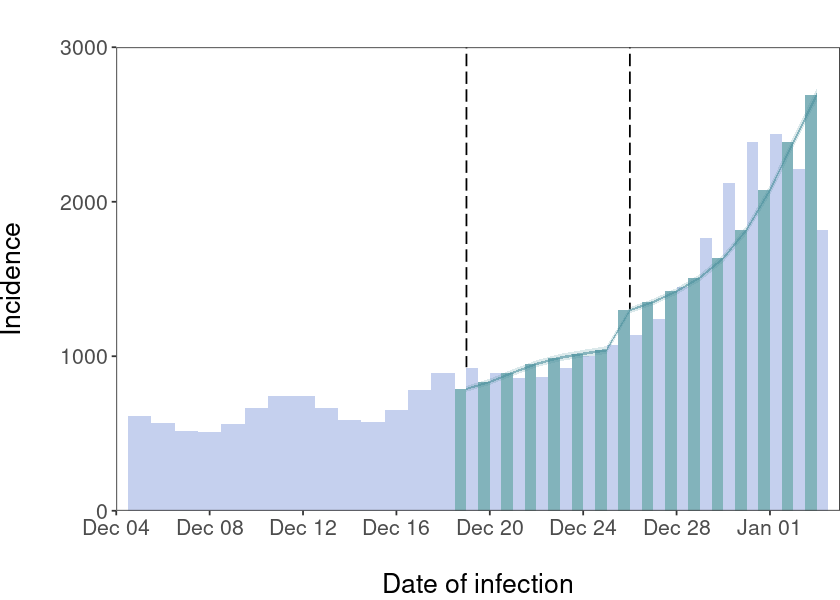

In [161]:
currmod <- 24

options(repr.plot.width=7,repr.plot.height=5)
ny_p <- plot_mod(plot_df_ny[[currmod]], "tokyo", "ny")
ny_p

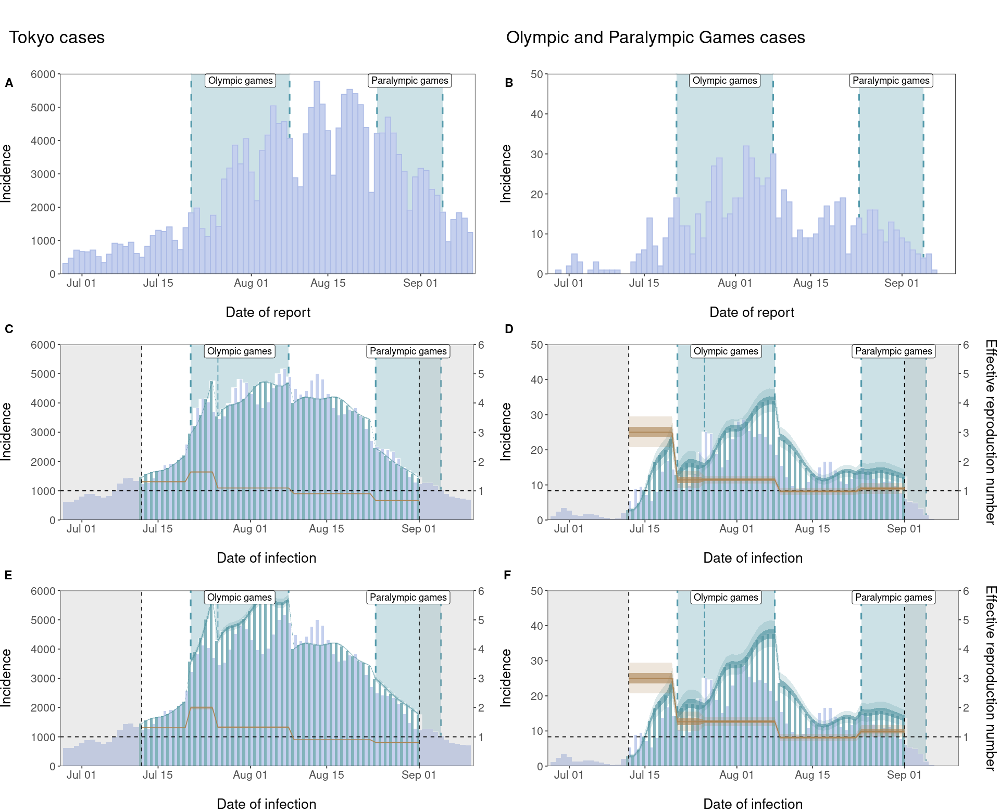

In [162]:
options(repr.plot.width=16,repr.plot.height=13)

opg_t <- cowplot::plot_grid(plot_title_tokyo, 
                            cowplot::plot_grid(get_ec(tokyo_rep, "tokyo", "report"),
                                               plot_mod(plot_df_opg[[currmod]], "tokyo", "opg"), 
                                               plot_mod(plot_df_spec[[currmod]], "tokyo", "spec"), 
                                               nrow=3, labels=c("A", "C", "E")), 
                            ncol=1, rel_heights = c(0.1, 1))
opg_g <- cowplot::plot_grid(plot_title_games,
                            cowplot::plot_grid(get_ec(games_rep, "games", "report"),
                                               plot_mod(plot_df_opg[[currmod]], "games", "opg"), 
                                               plot_mod(plot_df_spec[[currmod]], "games", "spec"), 
                                               nrow=3, labels=c("B", "D", "F")), 
                            ncol=1, rel_heights = c(0.1, 1))

opg_p <- cowplot::plot_grid(opg_t, opg_g, ncol=2)
opg_p

In [115]:
ggsave("../figures/Figure1.pdf", opg_p, width=16, height=13)
# ggsave("../figures/Figure1C.pdf", plot_mod(plot_df_opg, "tokyo", "opg"), width=8, height=5)
# ggsave("../figures/Figure1F.pdf", plot_mod(plot_df_opg, "games", "opg"), width=8, height=5)

## Heatmaps

In [116]:
heatdf <- rbindlist(lapply(1:nmods, \(i) { data.frame(df=i, time_period=factor(paste0("time period ", rep(1:5,2))), 
                                                      group=rep(groups, each=5),
                                                      grouplab=factor(paste0(str_to_title(rep(groups, each=5))," population")), 
                                                      theta=factor(models[i,1]), k_frac_g=factor(models[i,2]), 
                                                      k_frac_t=factor(models[i,3]), 
                                                      Rt=(res[[i]] |> filter(grepl("Rt_spec", variable)))$median) }))
rbrks <- seq(getmin(heatdf$Rt,0.5),getmax(heatdf$Rt,0.5),0.5)
Rbrks <- cut(heatdf$Rt,breaks=rbrks)
heatdf$Rt_breaks <- Rbrks |> as.factor()

heat_games_df <- (heatdf |> filter(group=="games"))[,-c("df", "k_frac_t")] |> distinct() 
heat_tokyo_df <- (heatdf |> filter(group=="gokyo"))[,-c("df", "k_frac_g")] |> distinct()

In [121]:
heat_tokyo_df

time_period,group,grouplab,theta,k_frac_t,Rt,Rt_breaks
<fct>,<chr>,<fct>,<fct>,<fct>,<dbl>,<fct>


In [117]:
heat_games_df |> group_split(group, time_period)

time_period,group,grouplab,theta,k_frac_g,Rt,Rt_breaks
<fct>,<chr>,<fct>,<fct>,<fct>,<dbl>,<fct>
time period 1,games,Games population,0.9,0.3,9.61895,"(9.5,10]"
time period 1,games,Games population,0.95,0.3,5.45403,"(5,5.5]"
time period 1,games,Games population,0.99,0.3,3.00161,"(3,3.5]"
time period 1,games,Games population,0.9,0.5,9.61895,"(9.5,10]"
time period 1,games,Games population,0.95,0.5,5.45403,"(5,5.5]"
time period 1,games,Games population,0.99,0.5,3.00161,"(3,3.5]"
time period 1,games,Games population,0.9,0.7,9.61895,"(9.5,10]"
time period 1,games,Games population,0.95,0.7,5.45403,"(5,5.5]"
time period 1,games,Games population,0.99,0.7,3.00161,"(3,3.5]"


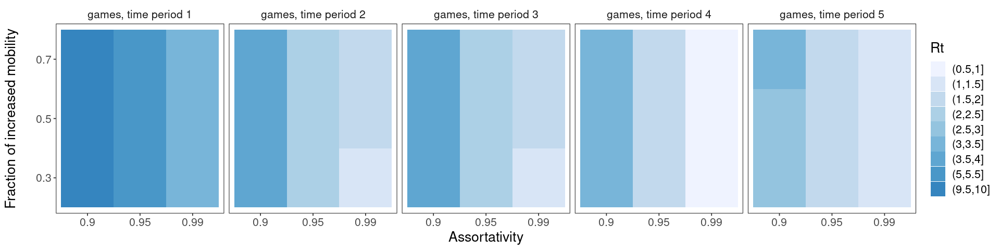

In [122]:
options(repr.plot.width=16,repr.plot.height=4)

plot_heat <- \(dat, grp) {
    
    ggplot(dat) +
    { if (grp=="games") geom_tile(aes(x=theta, y=k_frac_g, fill=Rt_breaks)) } +
    { if (grp=="tokyo") geom_tile(aes(x=theta, y=k_frac_t, fill=Rt_breaks)) } +
    facet_wrap(~group+time_period, ncol=5, labeller=label_wrap_gen(multi_line=FALSE)) +
    scale_y_discrete("Fraction of increased mobility\n") +
    scale_x_discrete("Assortativity") +
    scale_fill_manual("Rt", values=colorRampPalette(RColorBrewer::brewer.pal(7, "Blues"))(12)) +
    theme_bw() +
    theme(text=element_text(size=16), panel.grid.major=element_blank(), panel.grid.minor=element_blank(),
          strip.background=element_blank(), panel.border=element_rect(colour="black", fill=NA))
    }

plot_heat(heat_games_df, "games")
# plot_heat(heat_tokyo_df, "tokyo")

In [52]:
# heatlist <- heatdf |> group_split(group, time_period)

# plot_heat <- \(dat) {
#     ggplot(dat) +
#     geom_tile(aes(x=theta, y=k_frac, fill=Rt))
#     }

# options(repr.plot.width=15,repr.plot.height=12)
# heatplots <- lapply(1:nmods, \(i) plot_heat(heatlist[[i]]))
# plot_grid(plotlist=heatplots, nrow=3)

# Tokyo descriptives

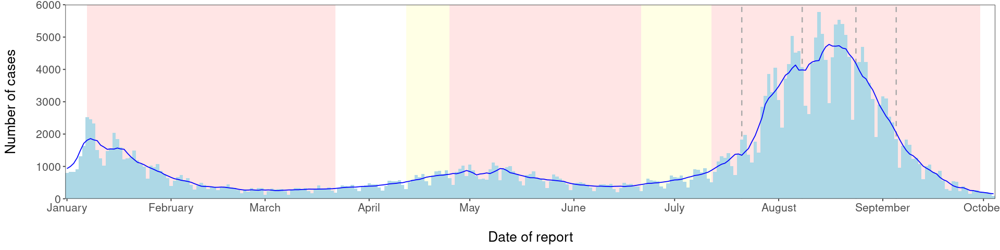

In [53]:


plot_epicurve <- \(dat) {
    
    xlims = c("2021-01-01", "2021-10-04")
    
    rep <- dat |> count(report) |> filter(report>=xlims[1] & report<=xlims[2]) 
    roll <- dat |> count(report) |> 
            mutate(roll=zoo::rollmean(n, k = 7, fill = NA)) |>
            filter(report>=xlims[1] & report<=xlims[2]) 
    
    ylims = c(0, getmax(rep$n, 1000))
    
    cols = c("soe" = "red", "manbo" = "yellow", "cases" = "lightblue", "roll" = "blue", "opg" = "darkgrey")
    
    ggplot() +
    annotate("rect", xmin=tokyo_manbo_starts[1], xmax=tokyo_manbo_ends[1]+1, ymin=0, ymax=Inf, fill=cols["manbo"], alpha=0.1) +
    annotate("rect", xmin=tokyo_manbo_starts[2], xmax=tokyo_manbo_ends[2]+1, ymin=0, ymax=Inf, fill=cols["manbo"], alpha=0.1) +
    annotate("rect", xmin=tokyo_soe_starts[2], xmax=tokyo_soe_ends[2]+1, ymin=0, ymax=Inf, fill=cols["soe"], alpha=0.1) +
    annotate("rect", xmin=tokyo_soe_starts[3], xmax=tokyo_soe_ends[3]+1, ymin=0, ymax=Inf, fill=cols["soe"], alpha=0.1) +
    annotate("rect", xmin=tokyo_soe_starts[4], xmax=tokyo_soe_ends[4], ymin=0, ymax=Inf, fill=cols["soe"], alpha=0.1) +
    
    # OPG vlines
    geom_vline(xintercept=c(olympics_start, olympics_end, paralympics_start, paralympics_end), 
               color=cols["opg"], linetype="dashed", size=0.7)  +
    
    geom_bar(data=rep, aes(x=report, y=n), stat="identity", fill=cols["cases"], width=1) +
    geom_line(data=roll, aes(x=report, y=roll), color=cols["roll"]) +

    scale_x_date("\nDate of report", expand=c(0,0), breaks="1 month", date_labels="%B") +
    scale_y_continuous("Number of cases\n", expand=c(0,0), limits=ylims) +
    theme_bw() +
    theme(text=element_text(size=16),
          panel.grid.major=element_blank(), panel.grid.minor=element_blank())
    
}

plot_epicurve(tokyo)

# Olympics descriptives

In [54]:
tokyo2020 |> count(jpn_resident)

jpn_resident,n
<fct>,<int>
resident,609
non-resident,269


In [55]:
tokyo2020 |> count(jpn_resident, quarantine)

jpn_resident,quarantine,n
<fct>,<fct>,<int>
resident,NA,609
non-resident,After quarantine,111
non-resident,During quarantine,155
non-resident,NA,3


Warning message:
“Removed 12 rows containing non-finite values (stat_count).”
Warning message:
“Removed 12 rows containing non-finite values (stat_count).”


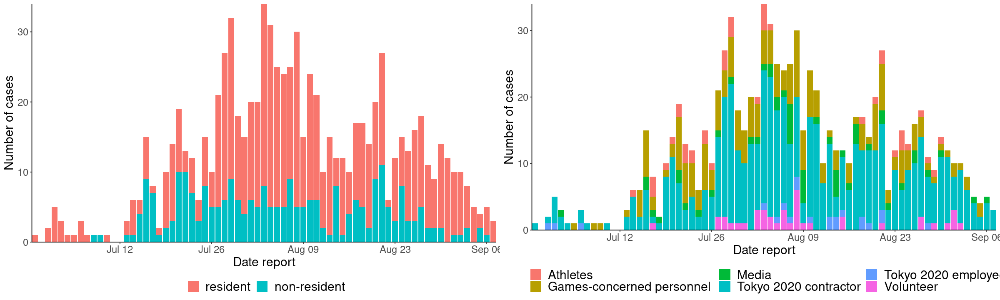

In [56]:
options(repr.plot.width=20,repr.plot.height=6)
a <- fig_bar(tokyo2020, c("report", "jpn_resident"))
b <- fig_bar(tokyo2020, c("report", "category"))
ggpubr::ggarrange(a,b)

Warning message:
“Removed 12 rows containing non-finite values (stat_count).”


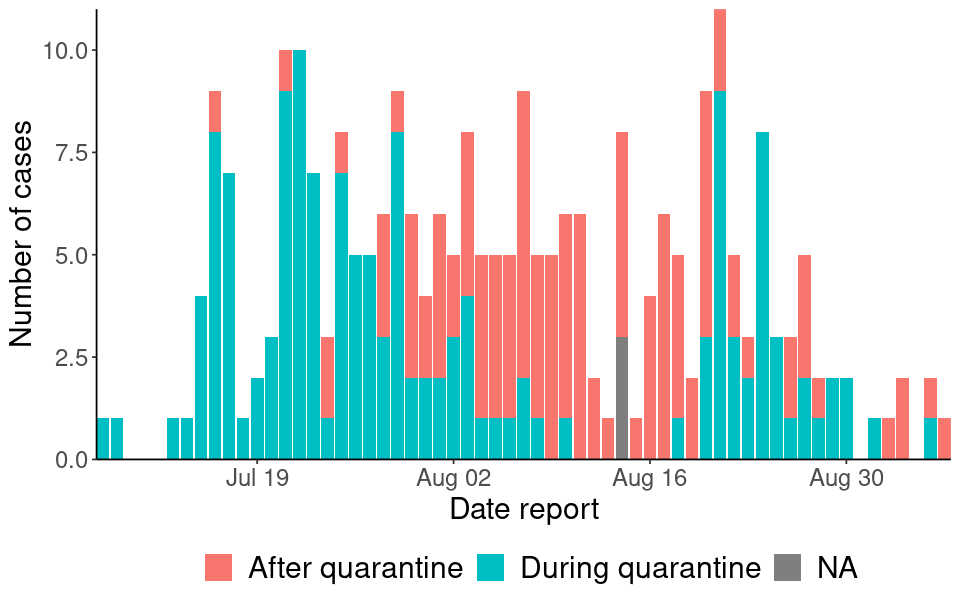

In [57]:
options(repr.plot.width=8,repr.plot.height=5)
fig_bar(tokyo2020 |> filter(jpn_resident=="non-resident"), c("report", "quarantine"))

Warning message:
“Removed 12 rows containing non-finite values (stat_count).”


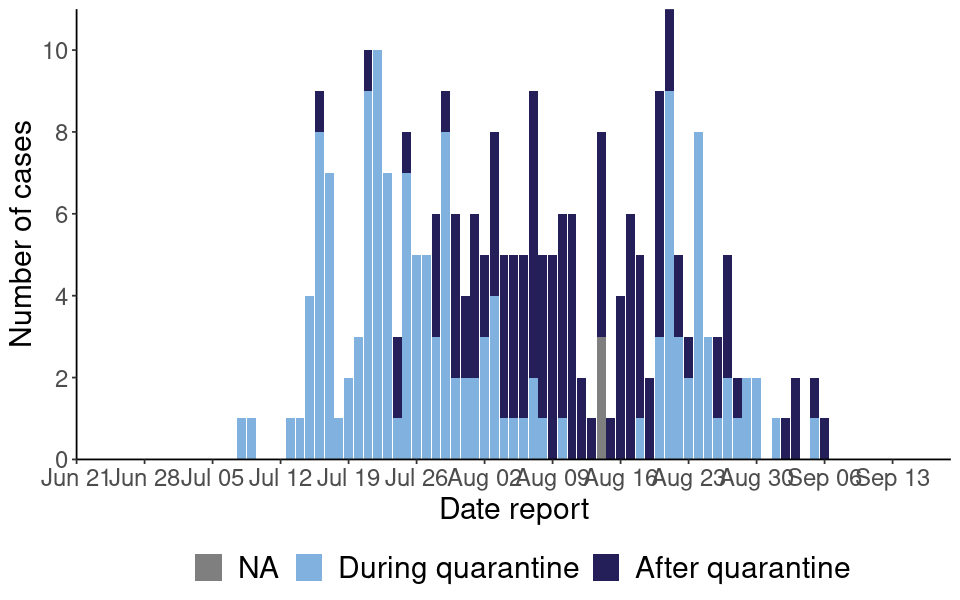

In [58]:
#### options(repr.plot.width=8,repr.plot.height=5)
fig_bar_poster <- \(dat, vars) { 
    cols <- c("#81B2DF", "#241F59") #"#4472C4" "#241F59"
    fsize <- 18
    max_y <- max((dat |> count(vars[2]))[,"n"])
    
    ggplot(dat) +
    geom_bar(aes_string(x=vars[1], fill=vars[2]), stat="count") +
    scale_x_date(paste0("Date ", vars[1]), date_breaks="1 weeks", date_labels="%b %d", 
                 expand=c(0,0), limits=c(olympics_start-30, paralympics_end+14)) +
    scale_y_continuous("Number of cases", breaks=seq(0,max_y,2), labels=scales::number_format(accuracy=1),
                       expand=c(0,0)) +
    scale_fill_manual("", values=rev(cols), guide = guide_legend(reverse=TRUE)) +
    theme_classic() +
    theme(text=element_text(size=fsize),
          plot.title=element_text(size=fsize),
          axis.title=element_text(size=fsize),
          legend.text=element_text(size=fsize),
          legend.position="bottom") 
}
fig_bar_poster(tokyo2020 |> filter(jpn_resident=="non-resident"), c("report", "quarantine"))

Warning message:
“Removed 12 rows containing non-finite values (stat_count).”


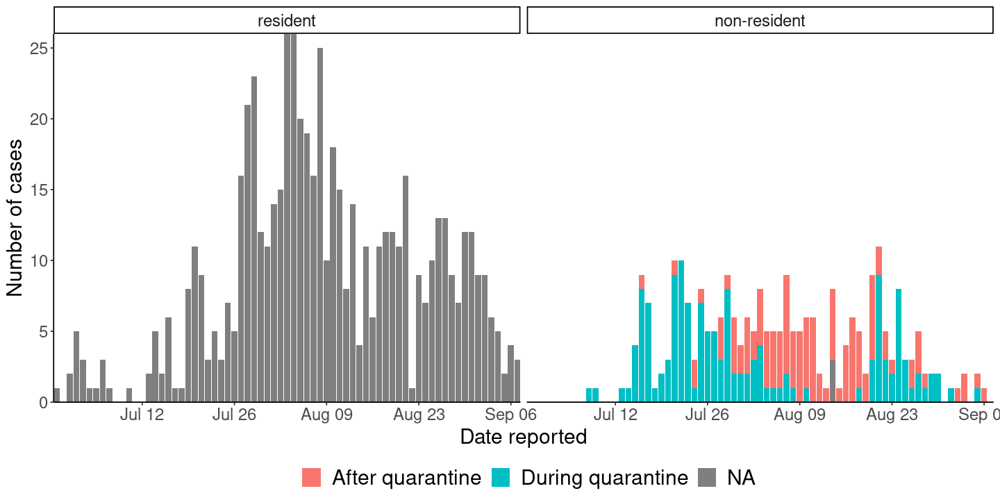

In [59]:
options(repr.plot.width=12,repr.plot.height=6)
fig_bar_wrap(tokyo2020, c("report", "quarantine", "jpn_resident"))

In [60]:
ni

ERROR: Error in eval(expr, envir, enclos): object 'ni' not found
